In [4]:
import xarray as xr
import numpy as np
import cdsapi
import os
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [8]:
# 공통 설정
chunk_dict = {
    "longitude": 180,   # 1440 → 8개 chunk
    "latitude": 90,     # 721 → 8개 chunk
    "level": 1,         # 8 → 그대로
    "number": 5,        # 50 → 10개 chunk
    "step": 5           # 29 → 6개 chunk
}

# 1. q
ds_q = xr.open_dataset(
    "/data03/Pangu_TC_ENS/TIGGE/ENS_data/ecmf_pf_q.nc",
    chunks=chunk_dict
).sel(longitude=slice(100, 160), latitude=slice(50, 10))
print("q loaded (lazy)")

# 2. u
ds_u = xr.open_dataset(
    "/data03/Pangu_TC_ENS/TIGGE/ENS_data/ecmf_pf_u.nc",
    chunks=chunk_dict
).sel(longitude=slice(100, 160), latitude=slice(50, 10))
print("u loaded (lazy)")

# 3. v
ds_v = xr.open_dataset(
    "/data03/Pangu_TC_ENS/TIGGE/ENS_data/ecmf_pf_v.nc",
    chunks=chunk_dict
).sel(longitude=slice(100, 160), latitude=slice(50, 10))
print("v loaded (lazy)")

# 4. z
ds_z = xr.open_dataset(
    "/data03/Pangu_TC_ENS/TIGGE/ENS_data/ecmf_pf_z.nc",
    chunks=chunk_dict
).sel(longitude=slice(100, 160), latitude=slice(50, 10))
print("z loaded (lazy)")

ds_t = xr.open_dataset(
    "/data03/Pangu_TC_ENS/TIGGE/ENS_data/ecmf_pf_t.nc",
    chunks=chunk_dict
).sel(longitude=slice(100, 160), latitude=slice(50, 10))
print("z loaded (lazy)")

ds = {'q': ds_q['q'], 'u': ds_u['u'], 'v': ds_v['v'], 'z': ds_z['gh'], 't': ds_t['t']}


q loaded (lazy)
u loaded (lazy)
v loaded (lazy)
z loaded (lazy)
z loaded (lazy)


In [13]:
ds_box

<xarray.DataArray 'q' (step: 29, latitude: 161, longitude: 241)> Size: 9MB
dask.array<getitem, shape=(29, 161, 241), dtype=float64, chunksize=(5, 90, 140), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float32 964B 100.0 100.2 100.5 ... 159.5 159.8 160.0
  * latitude   (latitude) float32 644B 50.0 49.75 49.5 49.25 ... 10.5 10.25 10.0
    level      int32 4B 1000
    number     int32 4B 10
  * step       (step) datetime64[ns] 232B 2022-08-27 ... 2022-09-03
Attributes:
    units:          kg kg**-1
    long_name:      Specific humidity
    standard_name:  specific_humidity

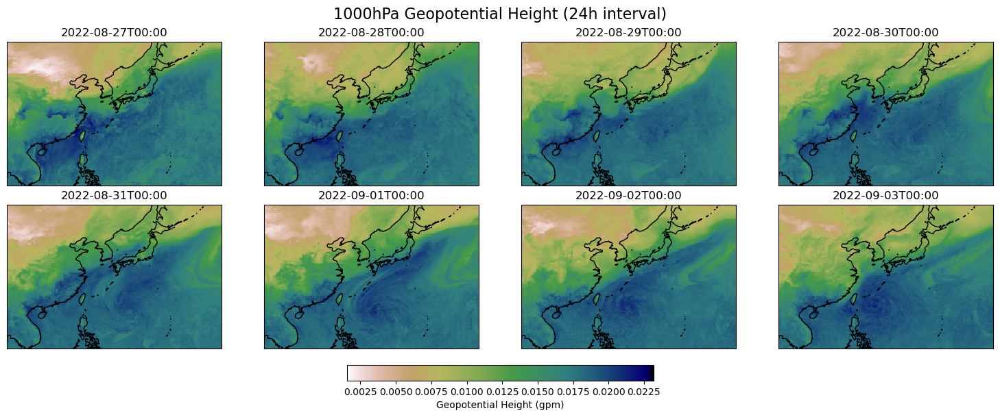

In [15]:
# 1000hPa 추출
variable = 'q'
level = 1000
number = 10  # ensemble member 선택 (1~50)
ds_box = ds[variable].sel(level=level, number=number)  # date, number는 원하는 값으로 선택

# 24시간 간격 선택 (6h 간격 자료라면 4 step마다 1일)
ds_24h = ds_box.isel(step=slice(0, None, 4))  

# 값의 전체 min/max 계산 (vmin, vmax 고정)
vmin = float(ds_box.min())
vmax = float(ds_box.max())

# subplot 갯수 설정
n_times = len(ds_24h.step)
ncols = 4
nrows = int(np.ceil(n_times / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows*3), constrained_layout=True, subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes.flat):
    if i < n_times:
        t = ds_24h.step[i]
        ds_24h.sel(step=t).plot(
            ax=ax, cmap="gist_earth_r", vmin=vmin, vmax=vmax, add_colorbar=False
        )
        ax.set_title(f"{str(t.values)[:16]}")
        ax.coastlines()
    else:
        ax.axis("off")  # 빈 subplot은 비우기

# 공통 colorbar 추가
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="gist_earth_r", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes, orientation="horizontal", fraction=0.05, pad=0.05
)
cbar.set_label("Geopotential Height (gpm)")

plt.suptitle("1000hPa Geopotential Height (24h interval)", fontsize=16)
plt.show()


# 앙상블끼리 비교

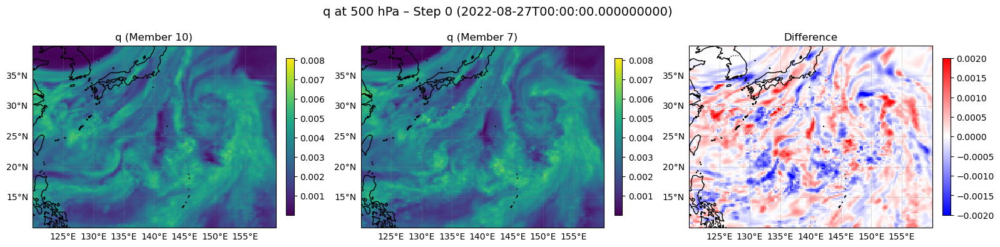

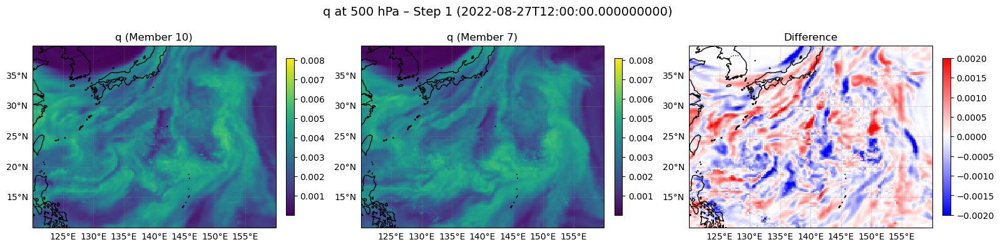

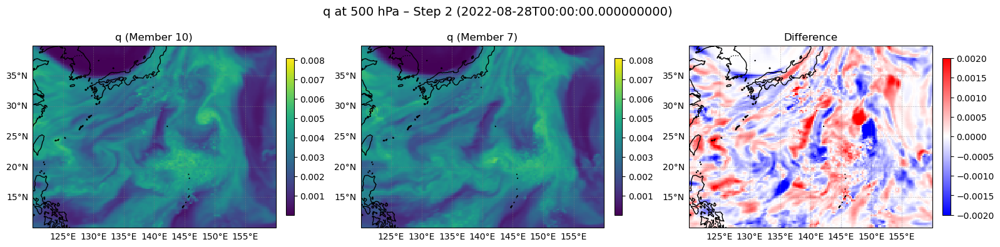

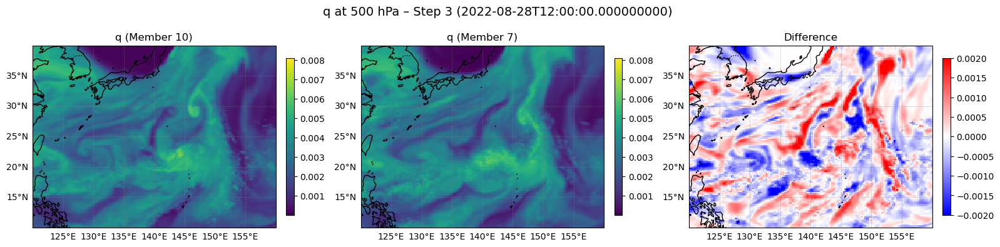

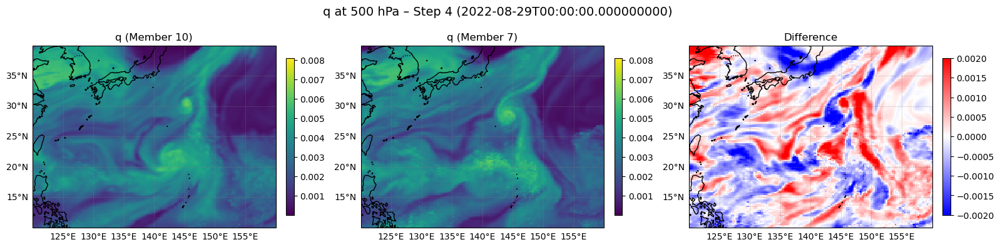

...

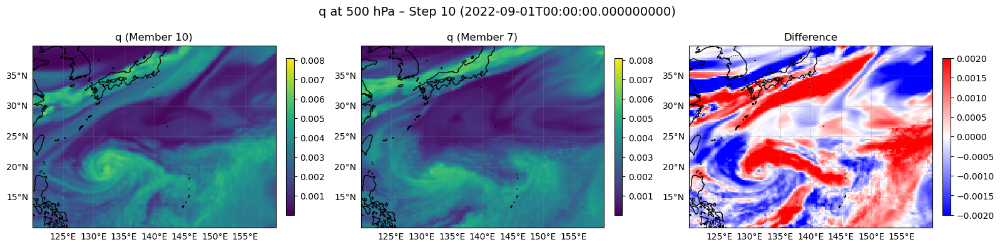

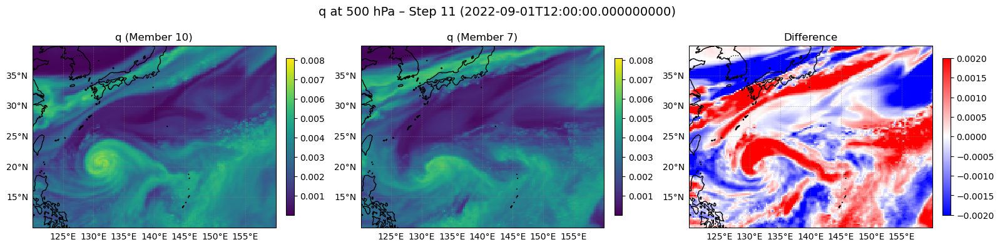

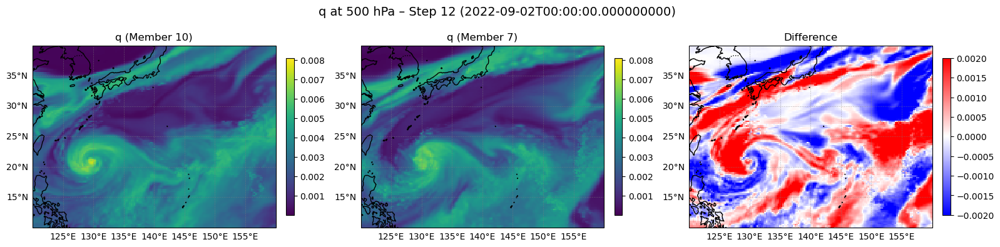

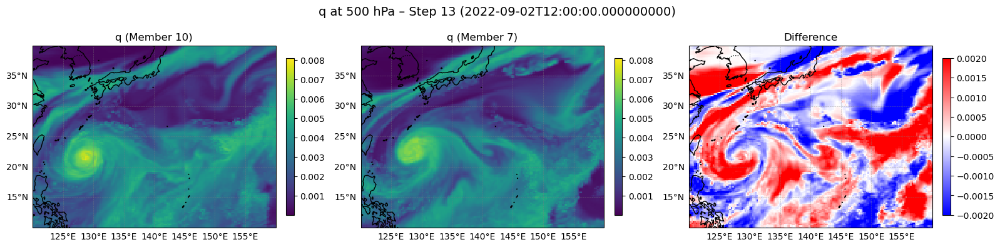

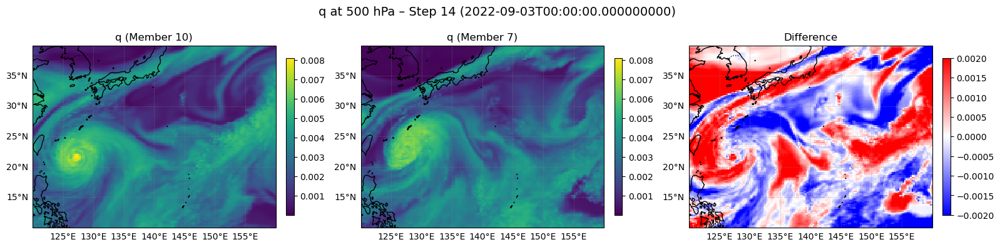

In [ ]:
# 1000hPa 추출
variable = 'q'
level = 500
number_1 = 10  # ensemble member 선택 (1~50)
number_2 = 7  # ensemble member 선택 (1~50)
ds_box_1 = ds[variable].sel(level=level, number=number_1)  # date, number는 원하는 값으로 선택
ds_box_2 = ds[variable].sel(level=level, number=number_2)  # date, number는 원하는 값으로 선택

# 24시간 간격 선택 (6h 간격 자료라면 4 step마다 1일)
ds_box_1 = ds_box_1.isel(step=slice(0, None, 2))
ds_box_2 = ds_box_2.isel(step=slice(0, None, 2))
ds_24h_diff = ds_box_1 - ds_box_2

# 값의 전체 min/max 계산 (vmin, vmax 고정)
vmin = float(ds_box_1.min())
vmax = float(ds_box_1.max())

steps = ds_box_1.step

for i, step in enumerate(steps):
    # step별 데이터 선택
    data1 = ds_box_1.sel(step=step)
    data2 = ds_box_2.sel(step=step)
    diff = ds_24h_diff.sel(step=step)
    
    # Figure 생성 (한 시간당 3개의 subplot)
    fig, axes = plt.subplots(1, 3, figsize=(16, 4), subplot_kw={'projection': ccrs.PlateCarree()})
    
    # 각 subplot에 그림
    im1 = axes[0].pcolormesh(data1.longitude, data1.latitude, data1, cmap='viridis', vmin=vmin, vmax=vmax)
    im2 = axes[1].pcolormesh(data2.longitude, data2.latitude, data2, cmap='viridis', vmin=vmin, vmax=vmax)
    im3 = axes[2].pcolormesh(diff.longitude, diff.latitude, diff, cmap='bwr', vmin = -0.002, vmax = 0.002)
    
    # 제목 설정
    axes[0].set_title(f"{variable} (Member {number_1})")
    axes[1].set_title(f"{variable} (Member {number_2})")
    axes[2].set_title(f"Difference")

    for ax in axes:
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.set_extent([120, 160, 10, 40], crs=ccrs.PlateCarree())
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
        gl.xlocator = mticker.FixedLocator(range(120, 161, 5))
        gl.ylocator = mticker.FixedLocator(range(10, 41, 5))
        gl.top_labels = False
        gl.right_labels = False
    
    # 컬러바
    fig.colorbar(im1, ax=axes[0], fraction=0.03, pad=0.04)
    fig.colorbar(im2, ax=axes[1], fraction=0.03, pad=0.04)
    fig.colorbar(im3, ax=axes[2], fraction=0.03, pad=0.04)
    
    # 전체 제목 (시간 정보 포함)
    fig.suptitle(f"{variable} at {level} hPa – Step {i} ({str(step.values)})", fontsize=14)
    
    plt.tight_layout()
    plt.show()


# Track TCs

In [21]:
ds['z']

<xarray.DataArray 'gh' (step: 29, number: 50, level: 9, latitude: 161,
                        longitude: 241)> Size: 4GB
dask.array<getitem, shape=(29, 50, 9, 161, 241), dtype=float64, chunksize=(5, 5, 1, 90, 140), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float32 964B 100.0 100.2 100.5 ... 159.5 159.8 160.0
  * latitude   (latitude) float32 644B 50.0 49.75 49.5 49.25 ... 10.5 10.25 10.0
  * level      (level) int32 36B 50 200 250 300 500 700 850 925 1000
  * number     (number) int32 200B 1 2 3 4 5 6 7 8 9 ... 43 44 45 46 47 48 49 50
  * step       (step) datetime64[ns] 232B 2022-08-27 ... 2022-09-03
Attributes:
    units:          gpm
    long_name:      Geopotential height
    standard_name:  geopotential_height

<xarray.DataArray 'number' ()> Size: 4B
array(1, dtype=int32)
Coordinates:
    number   int32 4B 1
Attributes:
    long_name:  ensemble_member


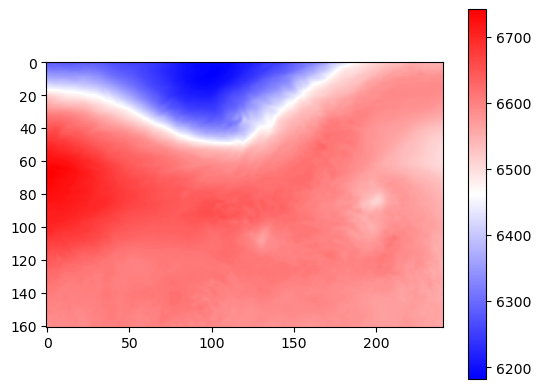

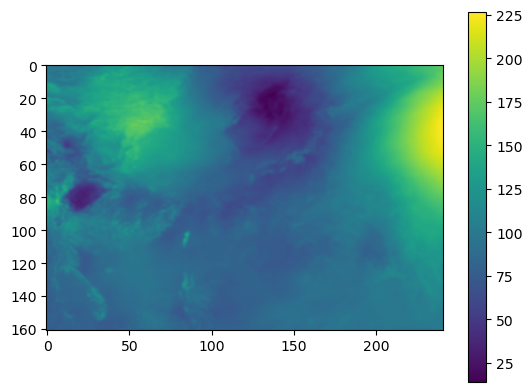

In [32]:

numbers = ds['z'].number
for i, number in enumerate(numbers):
    print(number)
    z_500 = ds['z'].sel(number = number, level = 500)
    z_200 = ds['z'].sel(number = number, level = 200)
    z_1000 = ds['z'].sel(number = number, level = 1000)

    z_diff = z_200 - z_500
    steps = z_diff.step
    plt.imshow(z_diff.sel(step=steps[0]), cmap='bwr')
    plt.colorbar()
    plt.show()

    plt.imshow(z_1000.sel(step=steps[0]), cmap='viridis')
    plt.colorbar()
    plt.show()

    break


=== Ensemble Member 1 ===
Step 5: center mismatch (261.3 km) → stop tracking
 → Track length: 1
Step 3: center mismatch (256.6 km, backward) → stop tracking

=== Ensemble Member 2 ===
Step 13: center mismatch (223.7 km) → stop tracking
 → Track length: 9
Step 3: center mismatch (255.6 km, backward) → stop tracking

=== Ensemble Member 3 ===
Step 6: center mismatch (227.6 km) → stop tracking
 → Track length: 2
Step 2: center mismatch (263.2 km, backward) → stop tracking

=== Ensemble Member 4 ===
Step 14: center mismatch (211.0 km) → stop tracking
 → Track length: 10
Step 2: center mismatch (280.5 km, backward) → stop tracking

=== Ensemble Member 5 ===
Step 13: center mismatch (285.7 km) → stop tracking
 → Track length: 9
Step 3: center mismatch (232.3 km, backward) → stop tracking

=== Ensemble Member 6 ===
Step 13: center mismatch (243.2 km) → stop tracking
 → Track length: 9
Step 2: center mismatch (278.6 km, backward) → stop tracking

=== Ensemble Member 7 ===
Step 14: center mism

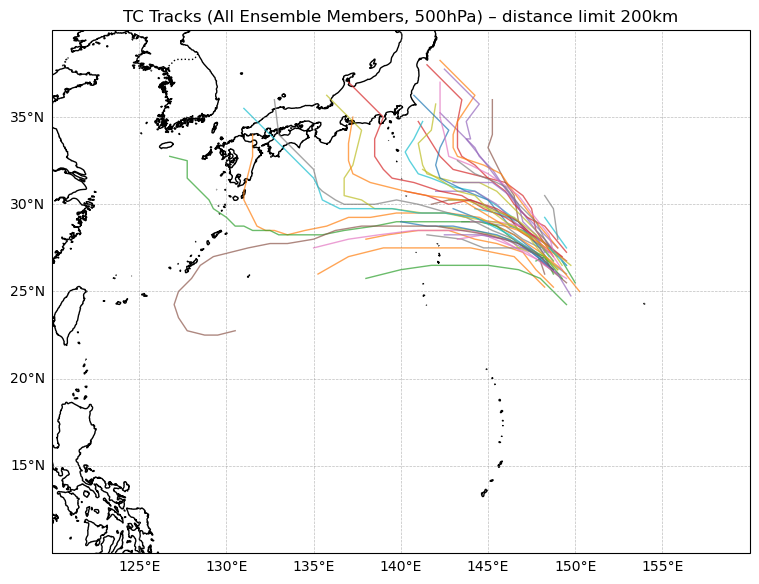

In [48]:
# 설정
level_sel = 500
init_lon, init_lat = 150, 25
search_radius_init = 3
search_radius = 2
start_idx = 4
threshold_km = 200  # 500hPa 중심과 1000hPa 중심의 최대 허용 거리 (km 단위)

# 도(degree) → km 근사 변환 함수
def haversine(lon1, lat1, lon2, lat2):
    R = 6371.0
    dlon = np.deg2rad(lon2 - lon1)
    dlat = np.deg2rad(lat2 - lat1)
    a = np.sin(dlat/2)**2 + np.cos(np.deg2rad(lat1)) * np.cos(np.deg2rad(lat2)) * np.sin(dlon/2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

steps = ds['z'].step
numbers = ds['z'].number

ensemble_tracks = {}

for number in numbers:
    print(f"\n=== Ensemble Member {int(number.values)} ===")

    z = ds['z'].sel(number=number)
    track = []

    # 1️⃣ 초기 중심 (500hPa 기준)
    z_local = z.sel(
        level=level_sel, step=steps[start_idx],
        longitude=slice(init_lon - search_radius_init, init_lon + search_radius_init),
        latitude=slice(init_lat + search_radius_init, init_lat - search_radius_init)
    )

    data = z_local.values
    if np.all(np.isnan(data)):
        print(f"Member {int(number.values)}: missing initial data, skipping.")
        continue

    min_idx = np.unravel_index(np.nanargmin(data), data.shape)
    center_lat = float(z_local.latitude.values[min_idx[0]])
    center_lon = float(z_local.longitude.values[min_idx[1]])
    track.append((steps[start_idx].values, center_lon, center_lat))

    # 2️⃣ 이후 step별 추적
    for i in range(start_idx + 1, len(steps)):
        step = steps[i]

        # (a) 500hPa 중심 추적
        z_local = z.sel(
            level=level_sel, step=step,
            longitude=slice(center_lon - search_radius, center_lon + search_radius),
            latitude=slice(center_lat + search_radius, center_lat - search_radius)
        )
        data = z_local.values
        if np.all(np.isnan(data)):
            print(f"Step {i}: missing 500hPa data")
            break

        min_idx = np.unravel_index(np.nanargmin(data), data.shape)
        center_lat_500 = float(z_local.latitude.values[min_idx[0]])
        center_lon_500 = float(z_local.longitude.values[min_idx[1]])

        # (b) 1000hPa에서 local min (지표 중심)
        z_local_1000 = z.sel(
            level=1000, step=step,
            longitude=slice(center_lon_500 - search_radius, center_lon_500 + search_radius),
            latitude=slice(center_lat_500 + search_radius, center_lat_500 - search_radius)
        )
        data_1000 = z_local_1000.values
        if np.all(np.isnan(data_1000)):
            print(f"Step {i}: missing 1000hPa data")
            break

        min_idx_1000 = np.unravel_index(np.nanargmin(data_1000), data_1000.shape)
        center_lat_1000 = float(z_local_1000.latitude.values[min_idx_1000[0]])
        center_lon_1000 = float(z_local_1000.longitude.values[min_idx_1000[1]])

        # (c) 거리 계산
        dist = haversine(center_lon_500, center_lat_500, center_lon_1000, center_lat_1000)

        if dist > threshold_km:
            print(f"Step {i}: center mismatch ({dist:.1f} km) → stop tracking")
            break

        # 정상일 경우 업데이트
        center_lon, center_lat = center_lon_500, center_lat_500
        track.append((step.values, center_lon, center_lat))

    ensemble_tracks[int(number.values)] = np.array(track, dtype=object)
    print(f" → Track length: {len(track)}")

    # 3️⃣ 이전 step 추적 (backward)
    for i in range(start_idx - 1, -1, -1):
        step = steps[i]

        # (a) 500hPa 중심 추적
        z_local = z.sel(
            level=level_sel, step=step,
            longitude=slice(center_lon - search_radius, center_lon + search_radius),
            latitude=slice(center_lat + search_radius, center_lat - search_radius)
        )
        data = z_local.values
        if np.all(np.isnan(data)):
            print(f"Step {i}: missing 500hPa data (backward)")
            break

        min_idx = np.unravel_index(np.nanargmin(data), data.shape)
        center_lat_500 = float(z_local.latitude.values[min_idx[0]])
        center_lon_500 = float(z_local.longitude.values[min_idx[1]])

        # (b) 1000hPa에서 local min
        z_local_1000 = z.sel(
            level=1000, step=step,
            longitude=slice(center_lon_500 - search_radius, center_lon_500 + search_radius),
            latitude=slice(center_lat_500 + search_radius, center_lat_500 - search_radius)
        )
        data_1000 = z_local_1000.values
        if np.all(np.isnan(data_1000)):
            print(f"Step {i}: missing 1000hPa data (backward)")
            break

        min_idx_1000 = np.unravel_index(np.nanargmin(data_1000), data_1000.shape)
        center_lat_1000 = float(z_local_1000.latitude.values[min_idx_1000[0]])
        center_lon_1000 = float(z_local_1000.longitude.values[min_idx_1000[1]])

        # (c) 거리 제한 검사
        dist = haversine(center_lon_500, center_lat_500, center_lon_1000, center_lat_1000)
        if dist > threshold_km:
            print(f"Step {i}: center mismatch ({dist:.1f} km, backward) → stop tracking")
            break

        # 역추적에서는 앞쪽에 추가 (시간이 과거이므로)
        track.insert(0, (step.values, center_lon_500, center_lat_500))
        center_lon, center_lat = center_lon_500, center_lat_500

# 3️⃣ 시각화
fig = plt.figure(figsize=(9,7))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent([120, 160, 10, 40], crs=ccrs.PlateCarree())

gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
gl.xlocator = mticker.FixedLocator(range(120, 161, 5))
gl.ylocator = mticker.FixedLocator(range(10, 41, 5))
gl.top_labels = False
gl.right_labels = False

for number, track in ensemble_tracks.items():
    ax.plot(track[:,1].astype(float), track[:,2].astype(float),
            '-', lw=1, alpha=0.7, transform=ccrs.PlateCarree(),
            label=f'Mem {number}')

ax.set_title(f"TC Tracks (All Ensemble Members, {level_sel}hPa) – distance limit {threshold_km}km")
plt.show()


=== Member 1 ===
2022-08-28T00:00:00.000000000 → lon=149.75, lat=24.00

=== Member 2 ===
2022-08-28T00:00:00.000000000 → lon=148.75, lat=25.25
2022-08-30T00:00:00.000000000 → lon=138.00, lat=28.00

=== Member 3 ===
2022-08-28T00:00:00.000000000 → lon=150.00, lat=25.50

=== Member 4 ===
2022-08-28T00:00:00.000000000 → lon=148.75, lat=27.00
2022-08-30T00:00:00.000000000 → lon=142.25, lat=32.75

=== Member 5 ===
2022-08-28T00:00:00.000000000 → lon=149.00, lat=27.50
2022-08-30T00:00:00.000000000 → lon=142.25, lat=35.25

=== Member 6 ===
2022-08-28T00:00:00.000000000 → lon=148.50, lat=26.75
2022-08-30T00:00:00.000000000 → lon=145.25, lat=36.00

=== Member 7 ===
2022-08-28T00:00:00.000000000 → lon=149.00, lat=26.00
2022-08-30T00:00:00.000000000 → lon=137.00, lat=28.00

=== Member 8 ===
2022-08-28T00:00:00.000000000 → lon=149.50, lat=26.00

=== Member 9 ===
2022-08-28T00:00:00.000000000 → lon=149.25, lat=26.50
2022-08-30T00:00:00.000000000 → lon=141.50, lat=31.75

=== Member 10 ===
2022-08-2

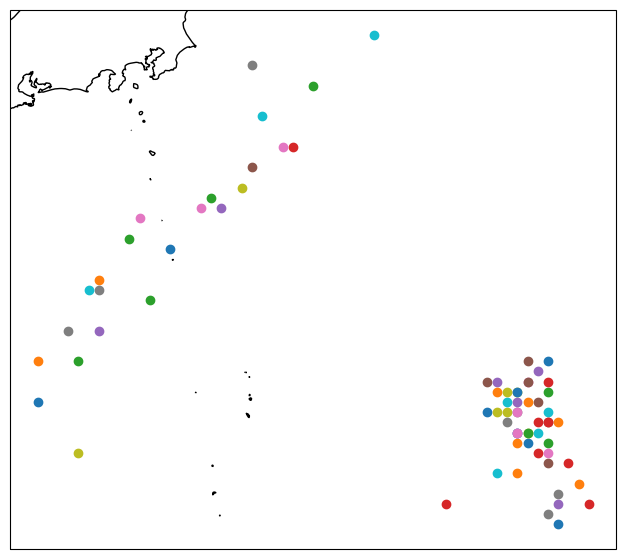

In [65]:
# 확인할 target 시각들 (형식은 ds['z'].step.values 형식에 맞춰주세요)
target_dates = [
    np.datetime64("2022-08-28T00:00:00"),  # 28일 00시
    np.datetime64("2022-08-30T00:00:00")   # 31일 00시
]

# 결과 저장용
selected_points = {int(num): [] for num in ensemble_tracks.keys()}

for num, track in ensemble_tracks.items():
    for step, lon, lat in track:
        if step in target_dates:
            selected_points[num].append((step, lon, lat))

fig, ax = plt.subplots(figsize=(9,7), subplot_kw={'projection': ccrs.PlateCarree()})
# 보기 좋게 출력
for num, pts in selected_points.items():
    if pts:
        print(f"\n=== Member {num} ===")
        for step, lon, lat in pts:
            plt.scatter(lon, lat, label=f'Mem {num} - {np.datetime_as_string(step)}', transform=ccrs.PlateCarree())
            print(f"{np.datetime_as_string(step)} → lon={lon:.2f}, lat={lat:.2f}")

ax.coastlines(resolution='10m')

In [167]:
# MetPy
from metpy.units import units
from metpy.calc import potential_temperature, lat_lon_grid_deltas
from metpy.calc import potential_vorticity_baroclinic as pv_bc

# --- REVISED calculate_potential_vorticity function ---
def calculate_potential_vorticity(temperature, pressure, u_wind, v_wind, lat_grid, lon_grid):
    """
    Calculate potential vorticity using MetPy's baroclinic potential vorticity function.

    Parameters:
    - temperature: Temperature (NumPy array)
    - pressure: Pressure (NumPy array)
    - u_wind: Zonal wind component (NumPy array)
    - v_wind: Meridional wind component (NumPy array)
    - lat_grid: 2D Latitude grid (NumPy array, degrees)
    - lon_grid: 2D Longitude grid (NumPy array, degrees)

    Returns:
    - Potential vorticity (pint.Quantity)
    """
    # 1. Convert all inputs to pint.Quantity with correct units
    temperature_q = temperature * units.K
    pressure_q = (pressure * units.hPa).to(units.Pa) # Convert hPa to Pa
    u_wind_q = u_wind * units.m / units.s
    v_wind_q = v_wind * units.m / units.s
    lat_grid_q = lat_grid * units.degrees
    lon_grid_q = lon_grid * units.degrees

    # 2. Calculate potential temperature (theta)
    theta = potential_temperature(pressure_q, temperature_q)

    # 3. Calculate dx and dy from the 2D lat/lon grids
    dx_grid_2d, dy_grid_2d = lat_lon_grid_deltas(lon_grid_q, lat_grid_q)

    # --- REVISED: Expand dx_grid and dy_grid to 3D ---
    # Assuming the 3D data shape is (level, latitude, longitude)
    # Add a new axis at the beginning (for the level dimension)
    dx_grid = dx_grid_2d[np.newaxis, :, :]
    dy_grid = dy_grid_2d[np.newaxis, :, :]

    # To ensure broadcasting works correctly, make sure dx_grid and dy_grid
    # have the same number of levels as your input data.
    # You can broadcast them explicitly to the shape of your 3D data,
    # or MetPy's internal broadcasting might handle it if the newaxis is correct.
    # Let's explicitly broadcast for clarity and robustness:
    num_levels = temperature_q.shape[0] # Assuming level is the first dimension
    dx_grid = np.broadcast_to(dx_grid, (temperature_q.shape[0], *dx_grid_2d.shape))
    dy_grid = np.broadcast_to(dy_grid, (temperature_q.shape[0], *dy_grid_2d.shape))
    # ---------------------------------------------------

    # 4. Calculate potential vorticity
    pv = pv_bc(
        potential_temperature=theta,
        pressure=pressure_q,
        u=u_wind_q,
        v=v_wind_q,
        dx=dx_grid, # Use the 3D dx_grid
        dy=dy_grid, # Use the 3D dy_grid
        latitude=lat_grid_q, # Latitude is used for Coriolis, can remain 2D or 3D
        # --- ADDED: Explicitly define the dimension indices ---
        # Assuming your 3D data is (level, latitude, longitude)
        vertical_dim=0, # Index for level dimension
        y_dim=1,        # Index for latitude dimension
        x_dim=2         # Index for longitude dimension
        # ---------------------------------------------------
    )

    return pv

Found 24 ensemble members at target_date
Found 0 ensemble members at input_date
Center: lon=140.34, lat=31.06
Major axis (map-space): [0.65772064 0.75326194]
Processing T ...
Processing Q ...
Processing Z ...
Processing U ...
Processing V ...
Basic variable sensitivities done.
Computing derived fields: vort/div and PV(z-based) ...
Using levels for PVz gradient: [300, 500, 700]
Derived sensitivities done.
Plotting T ...


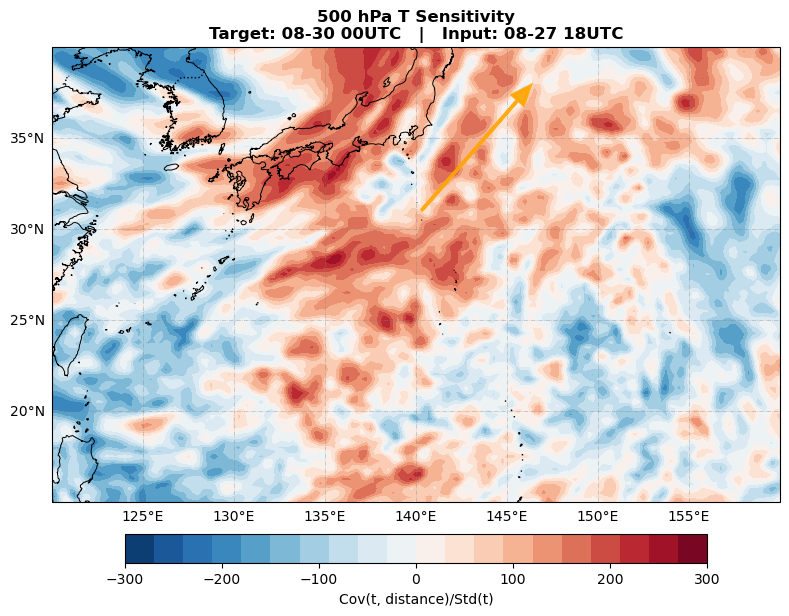

Plotting Q ...


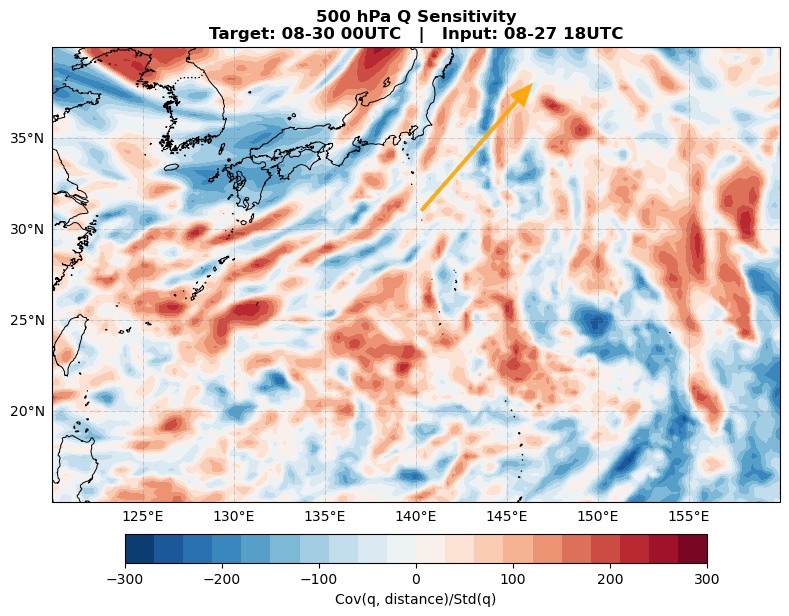

Plotting Z ...


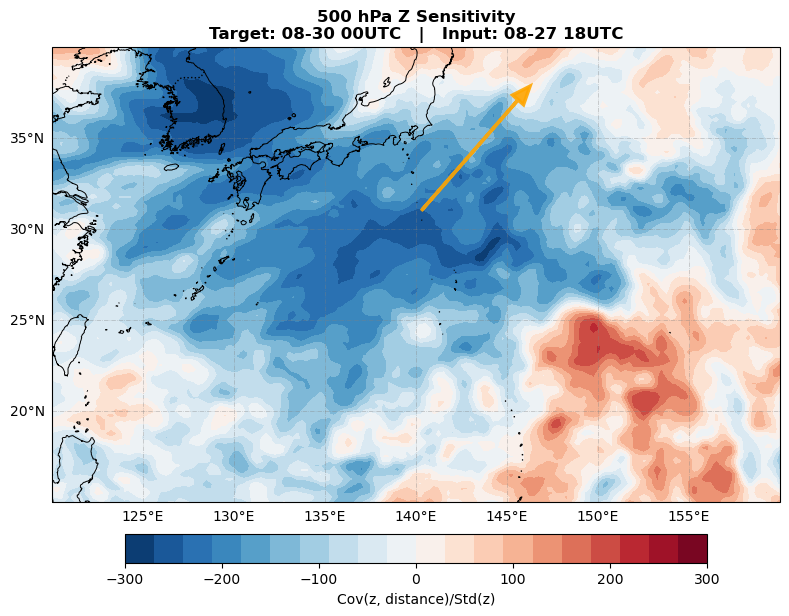

Plotting VORT ...


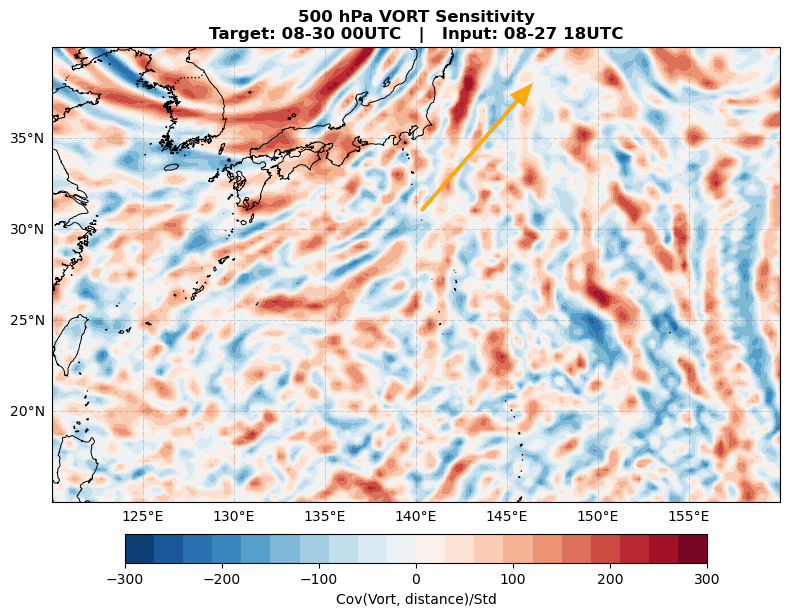

Plotting DIV ...


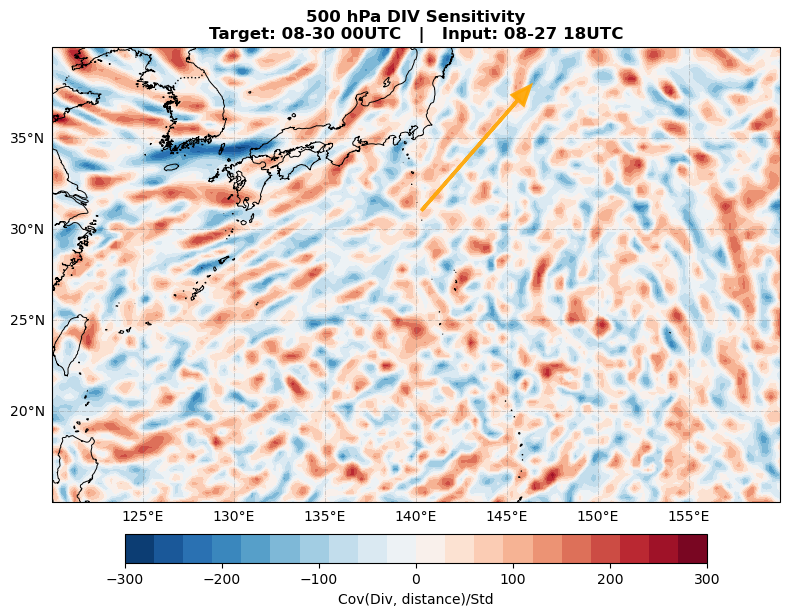

Plotting PVZ ...


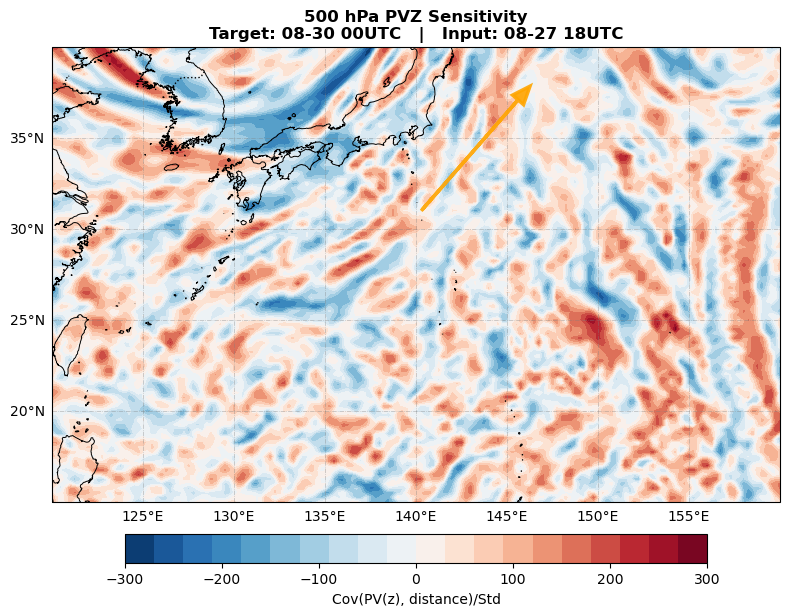

Plotting WIND ...


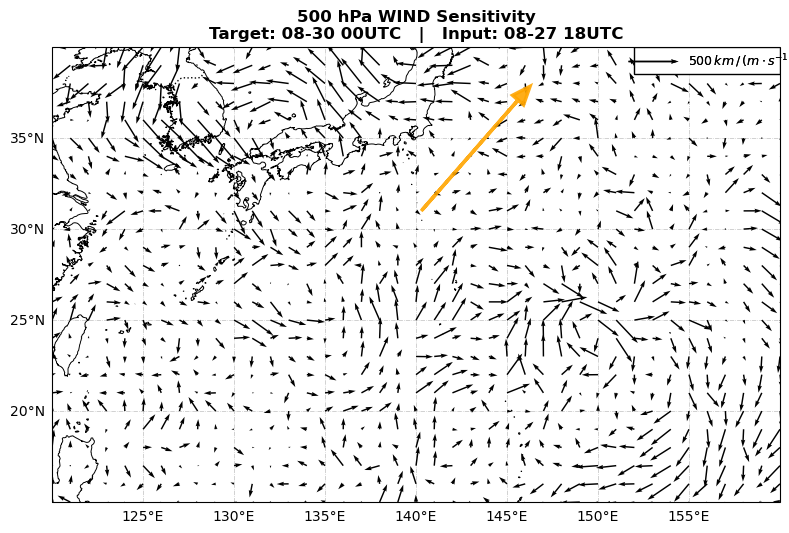

In [ ]:
# ============================================================
# Ensemble Sensitivity (ESA): t/q/z/u/v + vort/div + PV(z-based)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.patches as patches
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from sklearn.decomposition import PCA
from tqdm import tqdm



# 사용자 제공 유틸 (이미 주어진다고 가정)
# - compute_cov_var: (N, lat, lon) × distances(N,) → (lat, lon)
from tool.ESA import compute_cov_var

# ------------------------------------------------------------
# 0) 입력/설정
# ------------------------------------------------------------
target_date = np.datetime64("2022-08-30T00:00:00")
input_date  = np.datetime64("2022-08-29T00:00:00")

# 기본 분석 변수
var_list = ['t', 'q', 'z', 'u', 'v']   # 기본장
derived_list = ['vort', 'div', 'pvz']  # 파생장

# 등압면 레벨(기본 컨투어/바람 표시용)
level = 500

# PV(z) 계산용 수직 레벨(가용 레벨 사용)
levels_for_pv = [200, 250, 300, 500, 700, 850, 925, 1000]  # hPa

# 도식 영역 및 좌표계
extent = [120, 160, 15, 40]
proj = ccrs.PlateCarree()

# 중력가속도
g = 9.80665

# ------------------------------------------------------------
# 1) 타깃 시점 위치(ensemble) 추출
#    - ensemble_tracks와 ds(xarray) 가 이미 로드되어 있다고 가정
# ------------------------------------------------------------
tar_pos = []
ens_idx_list = []
for num, track in ensemble_tracks.items():
    for step, lon, lat in track:
        if step == target_date:
            tar_pos.append((lon, lat))
            ens_idx_list.append(num)

tar_pos = np.array(tar_pos)
print(f"Found {len(tar_pos)} ensemble members at target_date")

# 입력 시점 위치(표식용; 일부 멤버에 없을 수 있음)
input_pos = []
input_ids = []
for num, track in ensemble_tracks.items():
    for step, lon, lat in track:
        if step == input_date:
            input_pos.append((lon, lat))
            input_ids.append(num)

input_pos = np.array(input_pos)
print(f"Found {len(input_pos)} ensemble members at input_date")

# ------------------------------------------------------------
# 2) PCA (경도 cos(lat) 보정) 및 주축 투영거리(km)
#    - 기존 코드와 동일한 방식: 주축 좌표로 투영 후 ensemble 평균 제거, ×111
# ------------------------------------------------------------
# 경도 왜곡 보정용 좌표
corr_pos_tar = np.copy(tar_pos)
lon_mean = np.mean(tar_pos[:, 0])
corr_pos_tar[:, 0] = (tar_pos[:, 0] - lon_mean) * np.cos(np.radians(tar_pos[:, 1]))

pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)

# 주축으로 투영
projection = pca_tar.transform(corr_pos_tar)[:, 0]
ensemble_mean = np.mean(projection)
tar_proj_km = (projection - ensemble_mean) * 111.0  # deg→km 근사

# target 평균(그래픽 표시용 원점)
center = tar_pos.mean(axis=0)
# 2D 주축 단위벡터(지도상 표시용): 원래 좌표계에서 다시 구함
pca_visual = PCA(n_components=2)
pca_visual.fit(tar_pos - center)
major_axis = pca_visual.components_[0]  # 지도상 표시 화살표

print(f"Center: lon={center[0]:.2f}, lat={center[1]:.2f}")
print(f"Major axis (map-space): {major_axis}")

# ------------------------------------------------------------
# 3) 격자, 기본장 읽기
# ------------------------------------------------------------
# 공통 격자
lons = ds['u'].sel(level=level, step=input_date).longitude.values
lats = ds['u'].sel(level=level, step=input_date).latitude.values
lon2d, lat2d = np.meshgrid(lons, lats)

# dx, dy 평균 간격(m) 계산(메트피 연산용)
dx_m = (np.gradient(lon2d)[1] * 111000.0 * np.cos(np.deg2rad(lat2d))).mean() * units.meter
dy_m = (np.gradient(lat2d)[0] * 111000.0).mean() * units.meter

# ------------------------------------------------------------
# 4) ESA 감도 계산: 기본 변수(t, q, z, u, v)
#    - z는 지위고도[m] 사용 (만약 ds['z']가 geopotential이면 /g 변환)
# ------------------------------------------------------------
cov_results = {}

for var in var_list:
    print(f"Processing {var.upper()} ...")
    field = ds[var].sel(level=level, step=input_date)

    # z 단위 확인/변환
    if var == 'z':
        # 간단 휴리스틱: 값이 1e5 이상이면 m^2 s^-2 로 추정 → m 로 변환
        sample = np.nanmean(field.values)
        if np.isfinite(sample) and sample > 1e5:
            field_vals = field.values / g
        else:
            field_vals = field.values
        x_array = np.stack([field.sel(number=n, method="nearest").values for n in ens_idx_list], axis=0)
        # 위에서 field_vals만 확인했으므로 다시 추출
        x_array = np.stack([
            (ds['z'].sel(level=level, step=input_date, number=n).values / g
             if sample > 1e5 else
             ds['z'].sel(level=level, step=input_date, number=n).values)
            for n in ens_idx_list
        ], axis=0)
    else:
        x_array = np.stack([field.sel(number=n, method="nearest").values for n in ens_idx_list], axis=0)

    cov_results[var] = compute_cov_var(
        x_array=x_array,
        distances_tar=np.array(tar_proj_km),
        ens_idx_list=ens_idx_list,
        norm=True
    )

print("Basic variable sensitivities done.")

# ------------------------------------------------------------
# 5) 파생장: vorticity/divergence (수평), PV(z 기반)
#    - vorticity/divergence: 분석 레벨에서 계산
#    - PV(z): 여러 레벨 사용, dθ/dz와 (ζ+f)로 근사
# ------------------------------------------------------------
print("Computing derived fields: vort/div and PV(z-based) ...")

# 바람장(기본 레벨) 읽기
u_ens = np.stack([
    ds['u'].sel(level=level, step=input_date, number=n).values
    for n in ens_idx_list
], axis=0)
v_ens = np.stack([
    ds['v'].sel(level=level, step=input_date, number=n).values
    for n in ens_idx_list
], axis=0)

# vorticity/divergence
vort_all = []
div_all = []
for i in range(len(ens_idx_list)):
    u = (u_ens[i] * units('m/s'))
    v = (v_ens[i] * units('m/s'))
    vort = vorticity(u, v, dx=dx_m, dy=dy_m).magnitude
    divg = divergence(u, v, dx=dx_m, dy=dy_m).magnitude
    vort_all.append(vort)
    div_all.append(divg)

vort_all = np.stack(vort_all, axis=0)
div_all  = np.stack(div_all,  axis=0)

cov_results['vort'] = compute_cov_var(vort_all, np.array(tar_proj_km), ens_idx_list, norm=True)
cov_results['div']  = compute_cov_var(div_all,  np.array(tar_proj_km), ens_idx_list, norm=True)

# PV(z) 계산용 주변 레벨만 선택
levels_for_pv = [200, 250, 300, 500, 700, 850, 925, 1000]
idx_500 = int(np.argmin(np.abs(np.array(levels_for_pv) - level)))
use_idx = [max(idx_500-1, 0), idx_500, min(idx_500+1, len(levels_for_pv)-1)]
use_levels = [levels_for_pv[k] for k in use_idx]

print(f"Using levels for PVz gradient: {use_levels}")

p_pa = (np.array(use_levels) * 100.0) * units.pascal

# 다층 자료 읽기 (필요한 층만)
def load_ens_var(varname):
    return np.stack([
        np.stack([
            ds[varname].sel(level=lev, step=input_date, number=n).values
            for lev in use_levels
        ], axis=0)
        for n in ens_idx_list
    ], axis=0)

t_ens_L = load_ens_var('t')
u_ens_L = load_ens_var('u')
v_ens_L = load_ens_var('v')
z_ens_L = load_ens_var('z')
pv_all = []
for i in range(len(ens_idx_list)):
    pv = calculate_potential_vorticity(
        temperature=t_ens_sub[i],
        pressure=p,
        u_wind=u_ens_sub[i],
        v_wind=v_ens_sub[i],
        lat_grid=lat2d,
        lon_grid=lon2d
    )
    # 500hPa에 해당하는 층만 선택 (index=1)
    pv_all.append(pv[1].magnitude)

pv_all = np.stack(pv_all, axis=0)
cov_results['pv'] = compute_cov_var(pv_all, np.array(tar_proj_km), ens_idx_list, norm=True)


# ------------------------------------------------------------
# 6) 도식화 유틸
# ------------------------------------------------------------
def decorate_ax(ax):
    ax.coastlines(resolution='10m', linewidth=0.7)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_extent(extent, crs=proj)
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='-.', zorder=1)
    gl.xlocator = mticker.FixedLocator(range(int(extent[0]), int(extent[1])+1, 5))
    gl.ylocator = mticker.FixedLocator(range(int(extent[2]), int(extent[3])+1, 5))
    gl.top_labels = False
    gl.right_labels = False

def add_typhoon_features(ax, center, major_axis, input_pos, axis_len=8):
    if len(input_pos) > 0:
        ax.scatter(input_pos[:, 0], input_pos[:, 1],
                   color='limegreen', s=8, edgecolor='black', linewidth=0.4,
                   transform=proj, zorder=5)
    ax.arrow(center[0], center[1],
             major_axis[0]*axis_len, major_axis[1]*axis_len,
             transform=proj,
             head_width=0.8, head_length=1.0,
             fc='orange', ec='orange', lw=2.5, alpha=0.9, zorder=6)

def fmt_time(np_datetime64):
    return pd.to_datetime(np_datetime64).strftime("%m-%d %HUTC")

def nice_levels(arr, step=100):
    absmax = float(np.nanmax(np.abs(arr)))
    bound = (absmax // step + 1) * step if absmax > 0 else step
    levels = np.linspace(-bound, bound, 21)
    ticks = np.arange(-bound, bound + step, step)
    return levels, ticks, bound

# ------------------------------------------------------------
# 7) 도식화: 변수별 개별 Figure
#    - t/q/z/vort/div/pvz: contourf
#    - u(한 번만): quiver + quiverkey(박스)
# ------------------------------------------------------------
for var in ['t', 'q', 'z', 'vort', 'div', 'pvz', 'wind']:
    print(f"Plotting {var.upper()} ...")

    fig, ax = plt.subplots(figsize=(8, 7), subplot_kw={'projection': proj})
    decorate_ax(ax)

    if var == 'wind':
        cov_u = cov_results['u']
        cov_v = cov_results['v']
        skip = (slice(None, None, 4), slice(None, None, 4))

        # 바람 감도 퀴버
        Q = ax.quiver(
            lons[skip[1]], lats[skip[0]],
            cov_u[skip], cov_v[skip],
            transform=proj,
            scale=1000, scale_units='inches', width=0.002, color='k', zorder=2
        )

        # quiverkey 먼저 생성
        x0, y0, w, h = 0.8, 0.94, 0.2, 0.06
        qk = ax.quiverkey(
            Q, X=x0 + 0.3*w, Y=y0 + 0.50*h, U=500,
            label='$500\\,km\\, /\\, (m \\cdot s^{-1})$',
            labelpos='E', coordinates='axes',
            color='k', fontproperties={'size': 9, 'weight': 'bold'}, zorder=10
        )
        qk.set_zorder(10)
        ax.add_artist(qk)

        # quiverkey 뒤에 박스 추가 후, 다시 qk를 최상위로 재등록
        rect = patches.Rectangle((x0, y0), w, h,
                                 linewidth=1, edgecolor='black', facecolor='white',
                                 transform=ax.transAxes, zorder=5)
        ax.add_patch(rect)
        ax.artists.remove(qk)
        ax.add_artist(qk)
        qk.set_zorder(12)

    else:
        cov = cov_results[var]
        levels, ticks, bound = nice_levels(cov, step=100)
        cs = ax.contourf(lons, lats, cov, levels=levels, cmap='RdBu_r', transform=proj)
        cb = plt.colorbar(cs, ax=ax, orientation='horizontal', shrink=0.8, pad=0.05, ticks=ticks)
        label_map = {'pvz': 'Cov(PV(z), distance)/Std', 'vort': 'Cov(Vort, distance)/Std', 'div': 'Cov(Div, distance)/Std'}
        cb.set_label(label_map.get(var, f"Cov({var}, distance)/Std({var})"))

    # 공통 표식
    add_typhoon_features(ax, center, major_axis, input_pos, axis_len=8)

    ax.set_title(
        f"{level} hPa {var.upper()} Sensitivity\n"
        f"Target: {fmt_time(target_date)}   |   Input: {fmt_time(input_date)}",
        fontsize=12, fontweight='bold'
    )
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [160]:
np.max(ds['z'].sel(level=level, step=input_date, number = 1).values)

5990.945979318373

Plotting T...


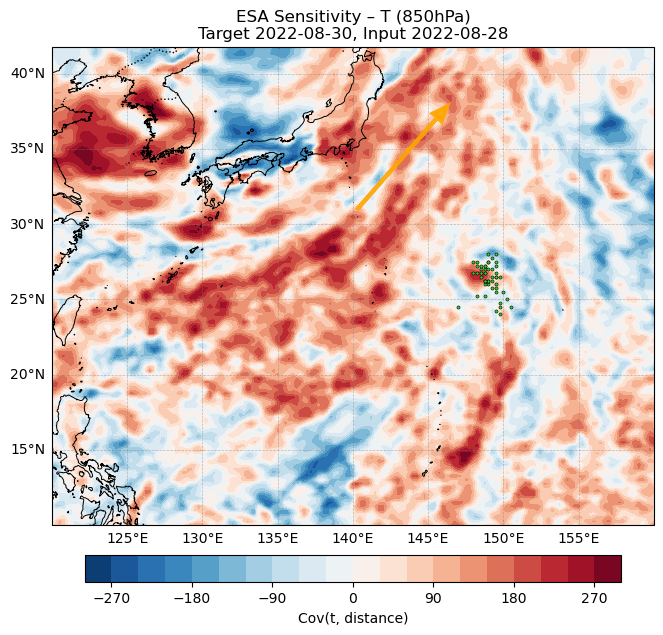

Plotting Q...


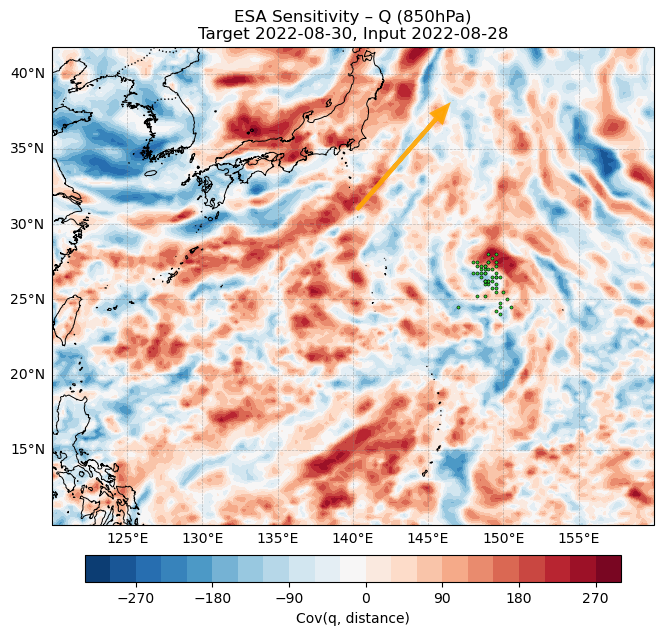

Plotting Z...


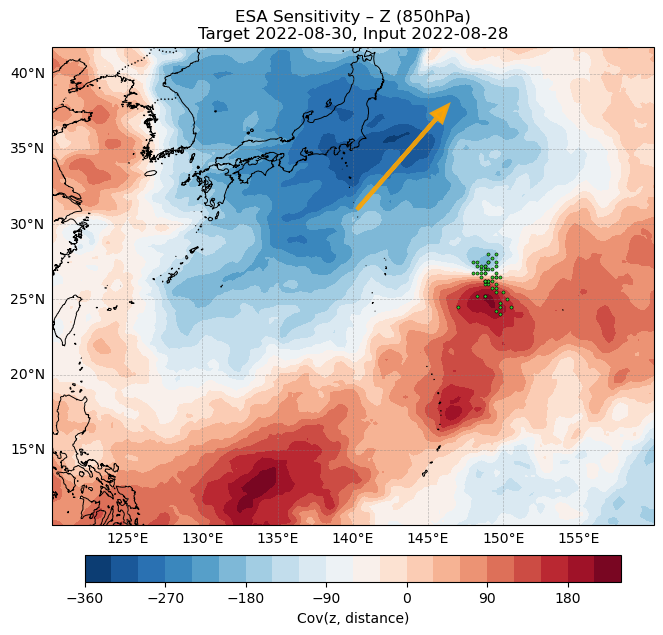

Plotting U...


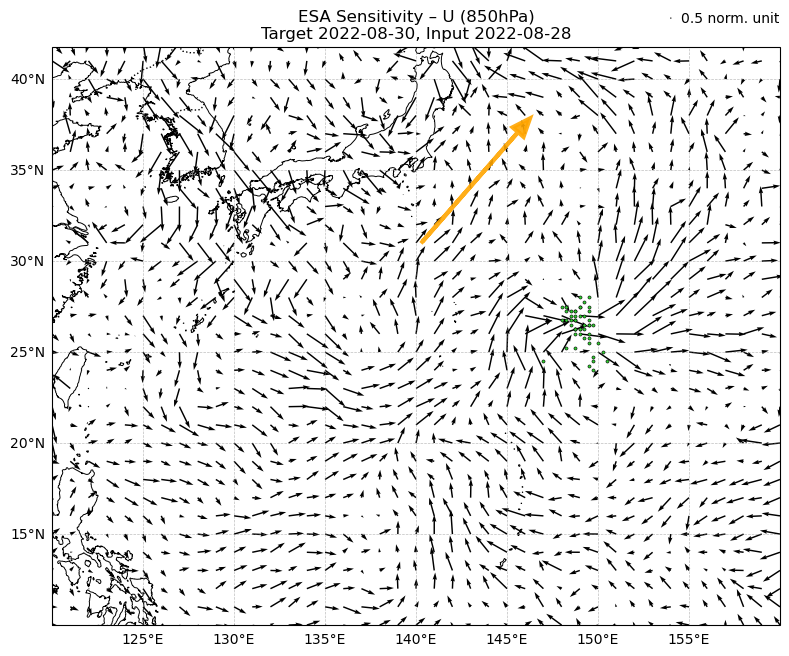

Plotting V...


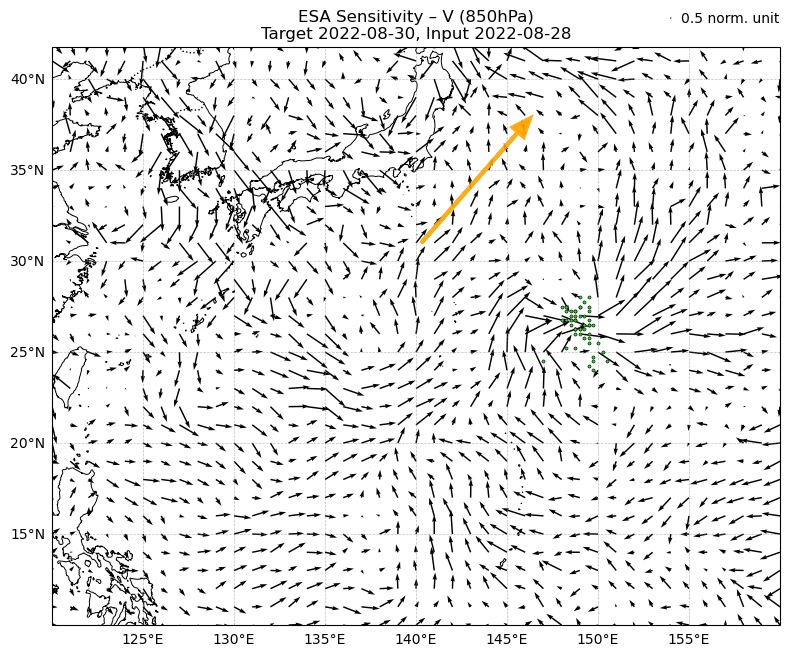

In [100]:
def decorate_ax(ax):
    ax.coastlines(resolution='10m', linewidth=0.7)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_extent([120, 160, 10, 40])
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
    gl.xlocator = mticker.FixedLocator(range(120, 161, 5))
    gl.ylocator = mticker.FixedLocator(range(10, 41, 5))
    gl.top_labels = False
    gl.right_labels = False


def add_typhoon_features(ax, center, major_axis, input_pos, axis_len=8):
    """태풍 중심, 주축, input 위치 추가"""
    if len(input_pos) > 0:
        ax.scatter(input_pos[:, 0], input_pos[:, 1],
                   color='limegreen', s=5, edgecolor='black', linewidth=0.4,
                   transform=ccrs.PlateCarree(), zorder=5)
    ax.arrow(center[0], center[1],
             major_axis[0]*axis_len, major_axis[1]*axis_len,
             transform=ccrs.PlateCarree(),
             head_width=0.8, head_length=1.0,
             fc='orange', ec='orange', lw=3, alpha=0.9, zorder=4)


# =====================================
# 🔄 변수 루프별로 독립 figure 생성
# =====================================
for var in ['t', 'q', 'z', 'u', 'v']:
    print(f"Plotting {var.upper()}...")

    fig, ax = plt.subplots(figsize=(8, 7),
                           subplot_kw={'projection': ccrs.PlateCarree()})
    decorate_ax(ax)

    if var in ['u', 'v']:  # 💨 바람 (U,V)
        cov_u = cov_results['u']
        cov_v = cov_results['v']
        skip = (slice(None, None, 4), slice(None, None, 4))

        Q = ax.quiver(
            lons[skip[1]], lats[skip[0]],
            cov_u[skip], cov_v[skip],
            transform=ccrs.PlateCarree(),
            scale=1000, scale_units='inches', width=0.002, color='k'
        )
        ax.quiverkey(Q, 0.85, 1.05, 0.5, '0.5 norm. unit', labelpos='E')
    else:  # 🌡 t/q/z는 contourf
        cs = ax.contourf(lons, lats, cov_results[var], 21, cmap='RdBu_r',
                         transform=ccrs.PlateCarree())
        cb = plt.colorbar(cs, ax=ax, orientation='horizontal', shrink=0.7, pad=0.05)
        cb.set_label(f"Cov({var}, distance)")

    add_typhoon_features(ax, center, major_axis, input_pos)

    ax.set_title(f"ESA Sensitivity – {var.upper()} ({level}hPa)\nTarget {str(target_date)[:10]}, Input {str(input_date)[:10]}")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

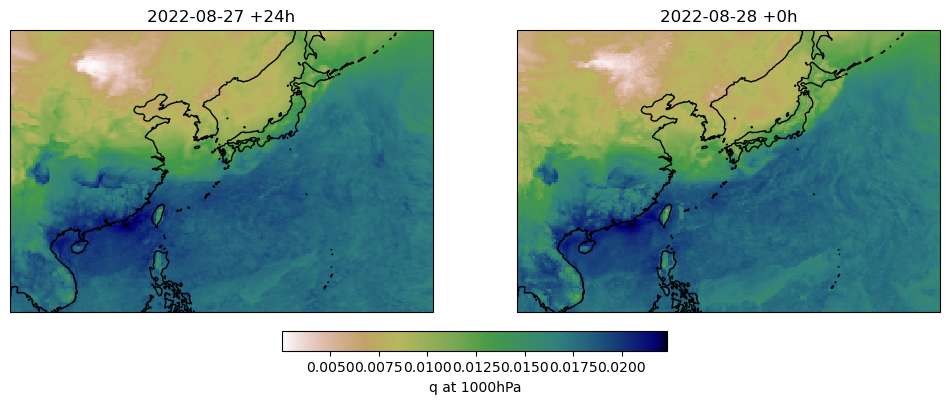

In [37]:
# 변수 선택
variable = 'q'

# 첫 번째 date의 24h step
data_27_24h = ds.sel(date=ds.date[0], step=np.timedelta64(24, "h"), level=1000, latitude=slice(50,10), longitude=slice(100,160))[variable]

# 두 번째 date의 0h step
data_28_0h = ds.sel(date=ds.date[1], step=np.timedelta64(0, "h"), level=1000, latitude=slice(50,10), longitude=slice(100,160))[variable]

# 공통 min/max
vmin = float(min(data_27_24h.min(), data_28_0h.min()))
vmax = float(max(data_27_24h.max(), data_28_0h.max()))

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(12,5), subplot_kw={'projection': ccrs.PlateCarree()})

data_27_24h.plot(ax=axes[0], cmap="gist_earth_r", vmin=vmin, vmax=vmax, add_colorbar=False)
axes[0].set_title("2022-08-27 +24h")
axes[0].coastlines()

data_28_0h.plot(ax=axes[1], cmap="gist_earth_r", vmin=vmin, vmax=vmax, add_colorbar=False)
axes[1].set_title("2022-08-28 +0h")
axes[1].coastlines()

# 공통 colorbar
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="gist_earth_r", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes, orientation="horizontal", fraction=0.05, pad=0.05
)
cbar.set_label("q at 1000hPa")

plt.show()


# 예측장 및 당시 분석장 불러오기

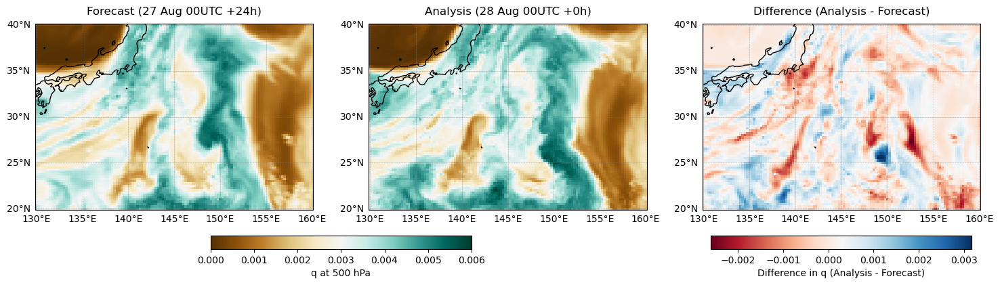

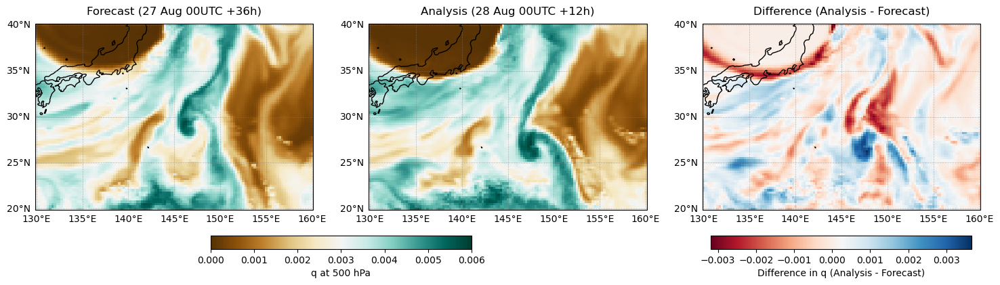

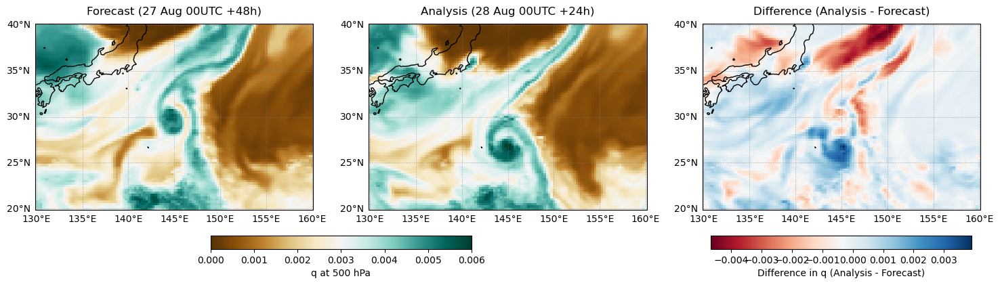

In [ ]:


# 변수와 영역
variable = 'q'
level = 500

for i in range(0, 25, 12):  # 0, 6, 12, 18, 24
    # 예보 (+24h)
    fc_24h = ds.sel(
        date=ds.date[0], step=np.timedelta64(int(24+i), "h"),
        level=level, latitude=slice(40,20), longitude=slice(130,160)
    )[variable]

    # 분석 (0h)
    an_0h = ds.sel(
        date=ds.date[1], step=np.timedelta64(int(i), "h"),
        level=level, latitude=slice(40,20), longitude=slice(130,160)
    )[variable]

    # 차이 (Analysis - Forecast)
    diff = an_0h - fc_24h

    # min/max for fc & an (같은 스케일)
    vmin_main = 0
    vmax_main = 0.006

    # min/max for diff
    vmin_diff = float(diff.min())
    vmax_diff = float(diff.max())

    # 그림
    fig, axes = plt.subplots(1, 3, figsize=(18,5), subplot_kw={'projection': ccrs.PlateCarree()})

    # --- Forecast ---
    im0 = fc_24h.plot(ax=axes[0], cmap="BrBG", vmin=vmin_main, vmax=vmax_main, add_colorbar=False)
    axes[0].set_title(f"Forecast (27 Aug 00UTC +{24+i}h)")
    axes[0].coastlines()

    # --- Analysis ---
    im1 = an_0h.plot(ax=axes[1], cmap="BrBG", vmin=vmin_main, vmax=vmax_main, add_colorbar=False)
    axes[1].set_title(f"Analysis (28 Aug 00UTC +{i}h)")
    axes[1].coastlines()

    # --- Difference ---
    im2 = diff.plot(ax=axes[2], cmap="RdBu", vmin=vmin_diff, vmax=vmax_diff, add_colorbar=False)
    axes[2].set_title("Difference (Analysis - Forecast)")
    axes[2].coastlines()

    # --- 좌표 격자: 5도 간격, 아래/왼쪽만 ---
    for ax in axes:
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
        gl.xlocator = mticker.FixedLocator(range(130, 161, 5))
        gl.ylocator = mticker.FixedLocator(range(20, 41, 5))
        gl.top_labels = False
        gl.right_labels = False

    # --- 공통 colorbar (fc & an) ---
    cbar1 = fig.colorbar(im0, ax=axes[:2], orientation="horizontal", fraction=0.05, pad=0.1)
    cbar1.set_label(f"{variable} at {level} hPa")

    # --- 차이 colorbar ---
    cbar2 = fig.colorbar(im2, ax=[axes[2]], orientation="horizontal", fraction=0.05, pad=0.1)
    cbar2.set_label(f"Difference in {variable} (Analysis - Forecast)")

    plt.show()


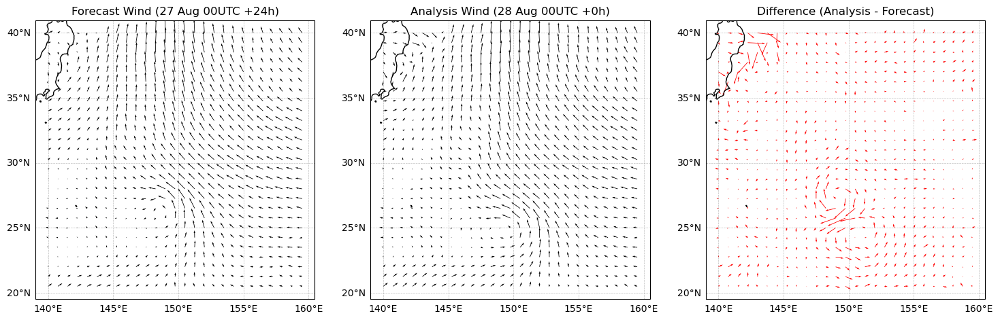

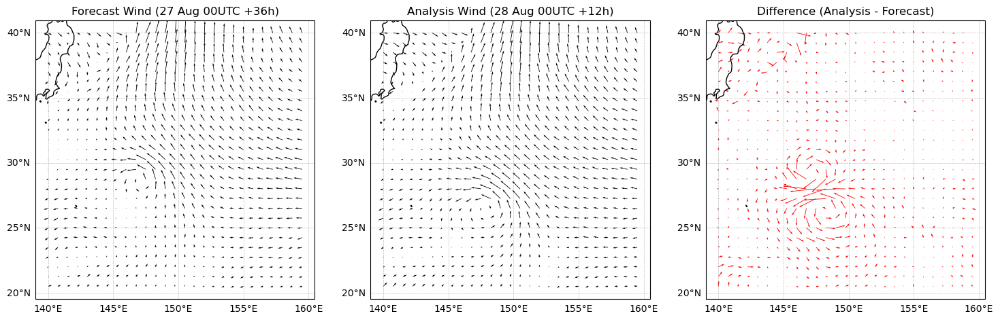

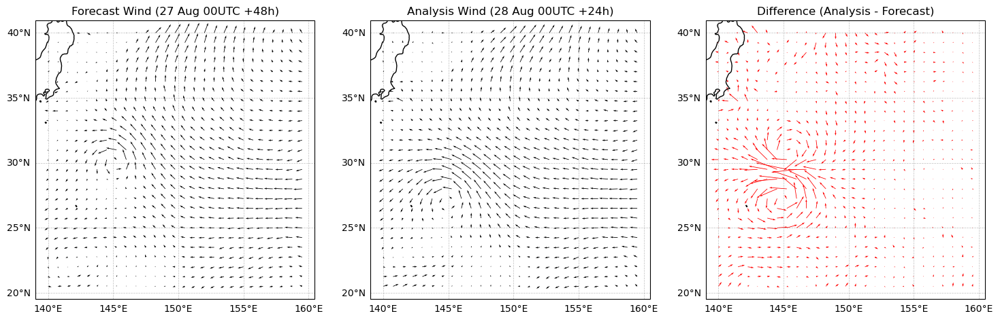

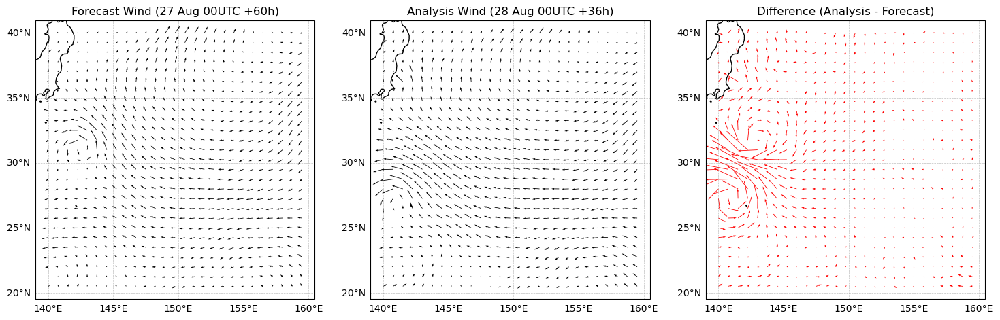

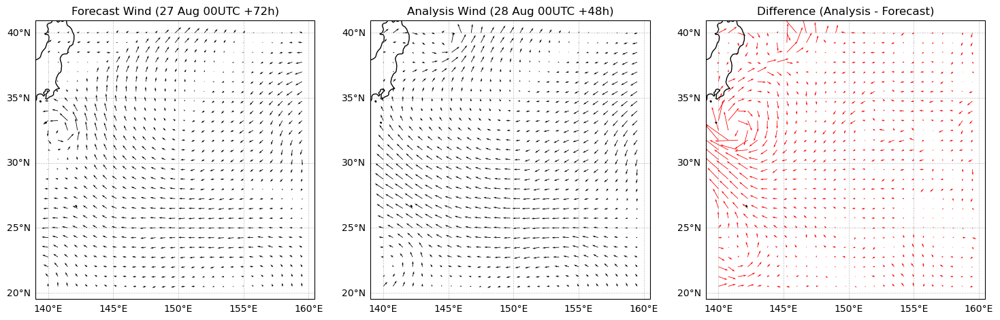

In [125]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.ticker as mticker

level = 850

for i in range(0, 49, 12):  # 0, 6, 12, 18, 24

    # --- Forecast u,v ---
    fc_u = ds.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["u"]
    fc_v = ds.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["v"]
    fc_z = ds_z.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["gh"]

    # --- Analysis u,v ---
    an_u = ds.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["u"]
    an_v = ds.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["v"]
    an_z = ds_z.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["gh"]

    # --- Difference (Analysis - Forecast) ---
    diff_u = an_u - fc_u
    diff_v = an_v - fc_v

    # --- Plot ---
    fig, axes = plt.subplots(1, 3, figsize=(18,6), subplot_kw={'projection': ccrs.PlateCarree()})

    # 격자 간격 (벡터가 너무 많으면 축소)
    skip = 3

    # --- Forecast ---
    axes[0].quiver(fc_u.longitude[::skip], fc_u.latitude[::skip],
                fc_u.values[::skip, ::skip], fc_v.values[::skip, ::skip],
                scale=400, width=0.002, headwidth=3)
    axes[0].set_title(f"Forecast Wind (27 Aug 00UTC +{24+i}h)")
    axes[0].coastlines()

    # --- Analysis ---
    axes[1].quiver(an_u.longitude[::skip], an_u.latitude[::skip],
                an_u.values[::skip, ::skip], an_v.values[::skip, ::skip],
                scale=400, width=0.002, headwidth=3)
    axes[1].set_title(f"Analysis Wind (28 Aug 00UTC +{i}h)")
    axes[1].coastlines()

    # --- Difference ---
    axes[2].quiver(diff_u.longitude[::skip], diff_u.latitude[::skip],
                diff_u.values[::skip, ::skip], diff_v.values[::skip, ::skip],
                scale=200, width=0.002, headwidth=3, color="red")
    axes[2].set_title("Difference (Analysis - Forecast)")
    axes[2].coastlines()

    # --- 좌표 격자: 5도 간격, 아래/왼쪽만 ---
    for ax in axes:
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
        gl.xlocator = mticker.FixedLocator(range(130, 161, 5))
        gl.ylocator = mticker.FixedLocator(range(20, 41, 5))
        gl.top_labels = False
        gl.right_labels = False

    plt.show()


[+0h] Forecast max wind = 18.14 m/s at (27.75, 150.00), minZ1000 = 84.8 at (26.00, 148.75)
[+0h] Analysis max wind = 17.56 m/s at (25.50, 151.50), minZ1000 = 89.8 at (24.25, 149.25)


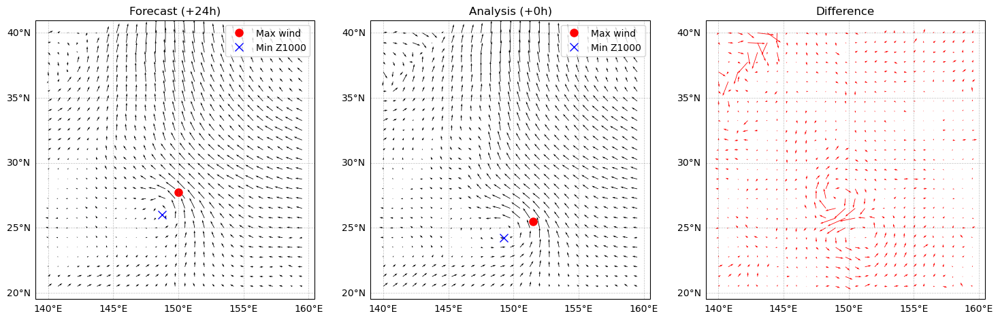

[+12h] Forecast max wind = 17.59 m/s at (29.50, 148.25), minZ1000 = 82.2 at (28.75, 147.25)
[+12h] Analysis max wind = 19.23 m/s at (28.00, 149.25), minZ1000 = 84.2 at (26.50, 148.00)


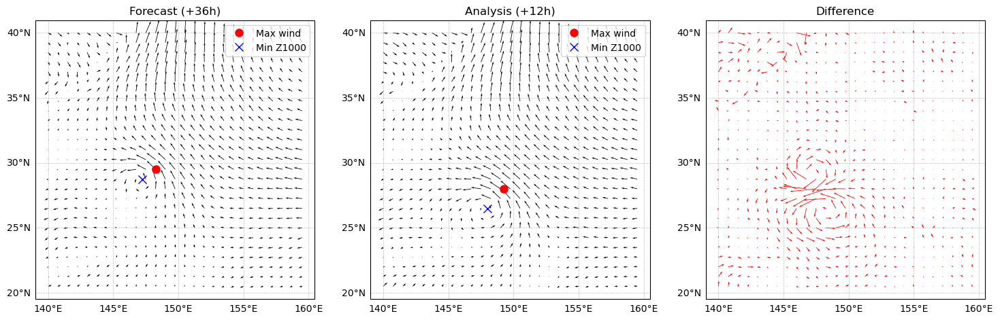

[+24h] Forecast max wind = 17.73 m/s at (30.75, 146.00), minZ1000 = 80.5 at (30.25, 145.25)
[+24h] Analysis max wind = 19.30 m/s at (29.00, 146.75), minZ1000 = 67.6 at (27.50, 145.00)


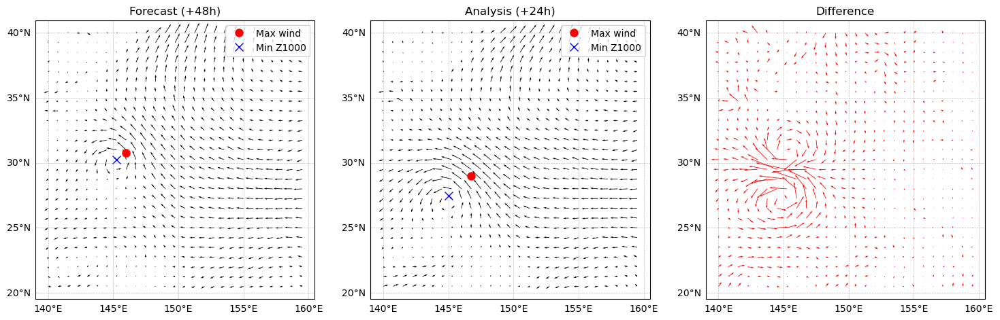

[+36h] Forecast max wind = 17.63 m/s at (32.00, 143.50), minZ1000 = 78.5 at (31.25, 142.75)
[+36h] Analysis max wind = 20.70 m/s at (28.50, 142.00), minZ1000 = 60.9 at (27.50, 141.25)


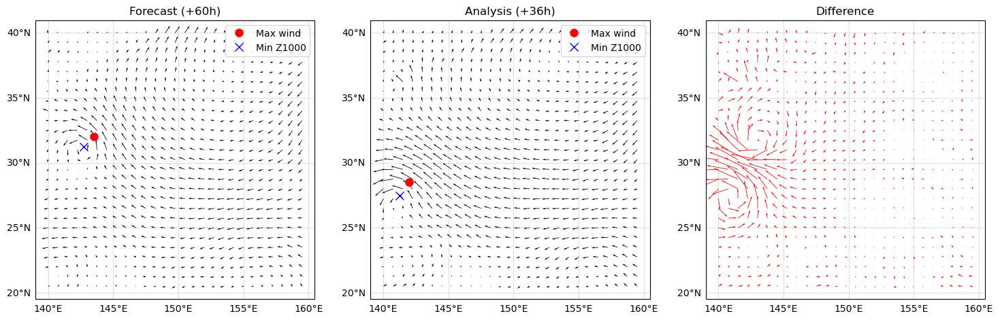

[+48h] Forecast max wind = 18.43 m/s at (32.75, 142.00), minZ1000 = 61.6 at (32.50, 141.00)
[+48h] Analysis max wind = 14.71 m/s at (29.00, 140.00), minZ1000 = 61.3 at (24.00, 140.00)


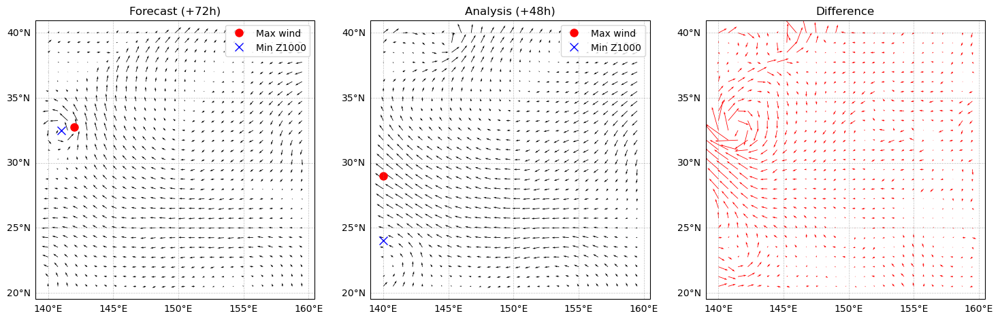

In [126]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.ticker as mticker

level = 850

# 초기 중심 조건
init_lat, init_lon = 25.0, 150.0
prev_fc_center = (init_lat, init_lon)
prev_an_center = (init_lat, init_lon)

for i in range(0, 49, 12):  # 0, 12, 24, 36, 48h
    # --- Forecast u,v ---
    fc_u = ds.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["u"]
    fc_v = ds.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["v"]
    fc_z_1000 = ds_z.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=1000, latitude=slice(40,20), longitude=slice(140,160))["gh"]

    # --- Analysis u,v ---
    an_u = ds.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["u"]
    an_v = ds.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(140,160))["v"]
    an_z_1000 = ds_z.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=1000, latitude=slice(40,20), longitude=slice(140,160))["gh"]

    # --- Wind speed ---
    fc_ws = np.sqrt(fc_u**2 + fc_v**2)
    an_ws = np.sqrt(an_u**2 + an_v**2)

    # -------- Tracking function --------
    def get_max_in_box(ws, lat_arr, lon_arr, center, box=5.0):
        lat_c, lon_c = center

        # 위도/경도 조건 필터링 (xarray 자체 기능 활용)
        sub_ws = ws.sel(latitude=slice(lat_c+box, lat_c-box),  # 위도가 내림차순일 수도 있음 주의!
                        longitude=slice(lon_c-box, lon_c+box))

        if sub_ws.size == 0:
            return None, None, None

        idx = np.unravel_index(np.argmax(sub_ws.values), sub_ws.shape)
        lat_max = float(sub_ws.latitude.values[idx[0]])
        lon_max = float(sub_ws.longitude.values[idx[1]])
        vmax = float(sub_ws.values[idx])
        return lat_max, lon_max, vmax
    
    def get_min_in_box(field, center, box=5.0):
        lat_c, lon_c = center
        sub = field.sel(latitude=slice(lat_c+box, lat_c-box),
                        longitude=slice(lon_c-box, lon_c+box))

        if sub.size == 0:
            return None, None, None

        idx = np.unravel_index(np.argmin(sub.values), sub.shape)
        lat_min = float(sub.latitude.values[idx[0]])
        lon_min = float(sub.longitude.values[idx[1]])
        vmin = float(sub.values[idx])
        return lat_min, lon_min, vmin

    # ---- Wind max tracking ----
    fc_lat, fc_lon, fc_max = get_max_in_box(fc_ws, fc_u.latitude.values, fc_u.longitude.values, prev_fc_center)
    if fc_lat is not None:
        prev_fc_center = (fc_lat, fc_lon)

    an_lat, an_lon, an_max = get_max_in_box(an_ws, an_u.latitude.values, an_u.longitude.values, prev_an_center)
    if an_lat is not None:
        prev_an_center = (an_lat, an_lon)

    # ---- MSLP (gh@1000hPa min) tracking ----
    fc_lat_p, fc_lon_p, fc_min = get_min_in_box(fc_z_1000, prev_fc_center)
    an_lat_p, an_lon_p, an_min = get_min_in_box(an_z_1000, prev_an_center)

    print(f"[+{i}h] Forecast max wind = {fc_max:.2f} m/s at ({fc_lat:.2f}, {fc_lon:.2f}), "
          f"minZ1000 = {fc_min:.1f} at ({fc_lat_p:.2f}, {fc_lon_p:.2f})")
    print(f"[+{i}h] Analysis max wind = {an_max:.2f} m/s at ({an_lat:.2f}, {an_lon:.2f}), "
          f"minZ1000 = {an_min:.1f} at ({an_lat_p:.2f}, {an_lon_p:.2f})")

    # ---- Plot ----
    fig, axes = plt.subplots(1, 3, figsize=(18,6), subplot_kw={'projection': ccrs.PlateCarree()})
    skip = 3

    # Forecast
    axes[0].quiver(fc_u.longitude[::skip], fc_u.latitude[::skip],
                   fc_u.values[::skip, ::skip], fc_v.values[::skip, ::skip],
                   scale=400, width=0.002, headwidth=3)
    if fc_lat: axes[0].plot(fc_lon, fc_lat, 'ro', markersize=8, label="Max wind")
    if fc_lat_p: axes[0].plot(fc_lon_p, fc_lat_p, 'bx', markersize=8, label="Min Z1000")
    axes[0].legend()
    axes[0].set_title(f"Forecast (+{24+i}h)")

    # Analysis
    axes[1].quiver(an_u.longitude[::skip], an_u.latitude[::skip],
                   an_u.values[::skip, ::skip], an_v.values[::skip, ::skip],
                   scale=400, width=0.002, headwidth=3)
    if an_lat: axes[1].plot(an_lon, an_lat, 'ro', markersize=8, label="Max wind")
    if an_lat_p: axes[1].plot(an_lon_p, an_lat_p, 'bx', markersize=8, label="Min Z1000")
    axes[1].legend()
    axes[1].set_title(f"Analysis (+{i}h)")

    # Difference
    diff_u = an_u - fc_u
    diff_v = an_v - fc_v
    axes[2].quiver(diff_u.longitude[::skip], diff_u.latitude[::skip],
                   diff_u.values[::skip, ::skip], diff_v.values[::skip, ::skip],
                   scale=200, width=0.002, headwidth=3, color="red")
    axes[2].set_title("Difference")

    for ax in axes:
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
        gl.xlocator = mticker.FixedLocator(range(130, 161, 5))
        gl.ylocator = mticker.FixedLocator(range(20, 41, 5))
        gl.top_labels = False
        gl.right_labels = False

    plt.show()



Steering flow: -2.9744001832344504 4.331085962742545


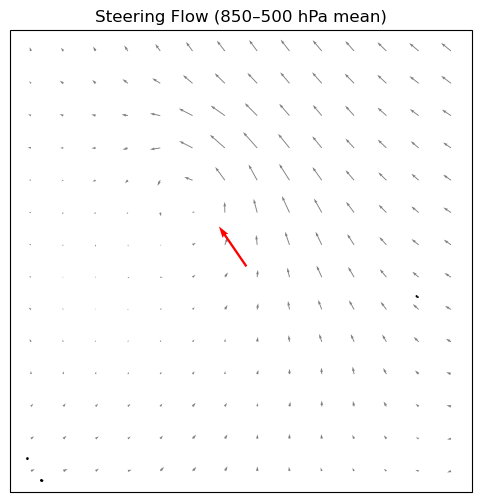

In [113]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# 태풍 중심 좌표 (예시: 25N, 150E)
tc_lat, tc_lon = 25, 150

# 영역: ±5도
lat_range = slice(tc_lat+5, tc_lat-5)
lon_range = slice(tc_lon-5, tc_lon+5)

# 수직 평균할 레벨
levels = [850, 700, 500]  # 원하는 레벨 리스트

# --- Forecast u,v ---
fc_u = ds.sel(date=ds.date[0], step=np.timedelta64(24, "h"),
              level=levels, latitude=lat_range, longitude=lon_range)["u"]
fc_v = ds.sel(date=ds.date[0], step=np.timedelta64(24, "h"),
              level=levels, latitude=lat_range, longitude=lon_range)["v"]

# 수직 평균
fc_u_mean = fc_u.mean(dim="level")
fc_v_mean = fc_v.mean(dim="level")

# 공간 평균 (태풍 주변 박스)
u_steer = fc_u_mean.mean(dim=("latitude", "longitude"))
v_steer = fc_v_mean.mean(dim=("latitude", "longitude"))

print("Steering flow:", float(u_steer.values), float(v_steer.values))

# --- 지도에 표시 ---
fig, ax = plt.subplots(figsize=(8,6), subplot_kw={'projection': ccrs.PlateCarree()})

# 바람장 표시 (예: 500hPa snapshot)
skip = 3
ax.quiver(fc_u.longitude[::skip], fc_u.latitude[::skip],
          fc_u_mean.values[::skip, ::skip], fc_v_mean.values[::skip, ::skip],
          scale=400, width=0.002, headwidth=3, alpha=0.5)

# Steering flow 벡터 (빨간 화살표로 중심에 표시)
ax.quiver(tc_lon, tc_lat, u_steer.values, v_steer.values,
          scale=50, color="red", width=0.005)

ax.set_title("Steering Flow (850–500 hPa mean)")
ax.coastlines()
plt.show()


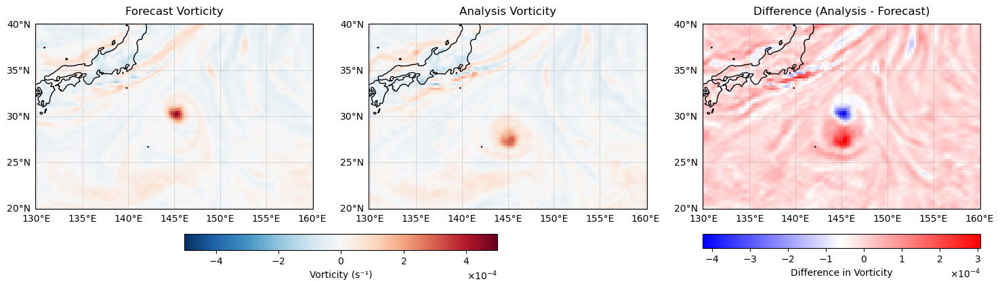

In [129]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.ticker as mticker
import metpy.calc as mpcalc
from metpy.units import units

level = 850

# --- Forecast u,v ---
fc_u = ds.sel(date=ds.date[0], step=np.timedelta64(48, "h"),
              level=level, latitude=slice(40,20), longitude=slice(130,160))["u"]
fc_v = ds.sel(date=ds.date[0], step=np.timedelta64(48, "h"),
              level=level, latitude=slice(40,20), longitude=slice(130,160))["v"]

# --- Analysis u,v ---
an_u = ds.sel(date=ds.date[1], step=np.timedelta64(24, "h"),
              level=level, latitude=slice(40,20), longitude=slice(130,160))["u"]
an_v = ds.sel(date=ds.date[1], step=np.timedelta64(24, "h"),
              level=level, latitude=slice(40,20), longitude=slice(130,160))["v"]

# --- Grid spacing (dx, dy in meters) ---
lat = fc_u.latitude.values * units.degrees
lon = fc_u.longitude.values * units.degrees
dx, dy = mpcalc.lat_lon_grid_deltas(lon, lat)

# --- Vorticity ---
fc_vort = mpcalc.vorticity(fc_u.values * units('m/s'),
                           fc_v.values * units('m/s'),
                           dx=dx, dy=dy)

an_vort = mpcalc.vorticity(an_u.values * units('m/s'),
                           an_v.values * units('m/s'),
                           dx=dx, dy=dy)

diff_vort = (an_vort - fc_vort).to('1/s')

# --- Plot ---
fig, axes = plt.subplots(1, 3, figsize=(18,6), subplot_kw={'projection': ccrs.PlateCarree()})

vmin = -5e-04
vmax = 5e-04

im0 = axes[0].pcolormesh(fc_u.longitude, fc_u.latitude, fc_vort.magnitude,
                         cmap="RdBu_r", vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
axes[0].set_title("Forecast Vorticity")
axes[0].coastlines()

im1 = axes[1].pcolormesh(an_u.longitude, an_u.latitude, an_vort.magnitude,
                         cmap="RdBu_r", vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
axes[1].set_title("Analysis Vorticity")
axes[1].coastlines()

im2 = axes[2].pcolormesh(an_u.longitude, an_u.latitude, diff_vort.magnitude,
                         cmap="bwr", transform=ccrs.PlateCarree())
axes[2].set_title("Difference (Analysis - Forecast)")
axes[2].coastlines()

# 좌표 격자
for ax in axes:
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
    gl.xlocator = mticker.FixedLocator(range(130, 161, 5))
    gl.ylocator = mticker.FixedLocator(range(20, 41, 5))
    gl.top_labels = False
    gl.right_labels = False

from matplotlib.ticker import ScalarFormatter

# Colorbar
cbar1 = fig.colorbar(im0, ax=axes[:2], orientation="horizontal", fraction=0.05, pad=0.08, label="Vorticity (s⁻¹)")
cbar2 = fig.colorbar(im2, ax=[axes[2]], orientation="horizontal", fraction=0.05, pad=0.08, label="Difference in Vorticity")

for cb in [cbar1, cbar2]:
    cb.formatter = ScalarFormatter(useMathText=True)
    cb.formatter.set_powerlimits((-2, 2))  # -2~2 범위 벗어나면 지수 표기
    cb.update_ticks()

plt.show()


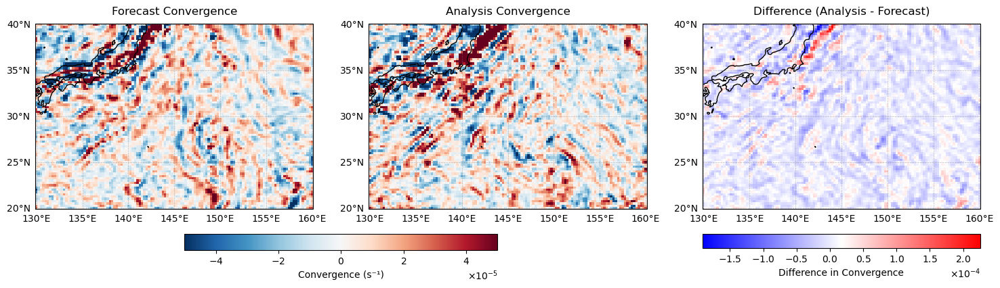

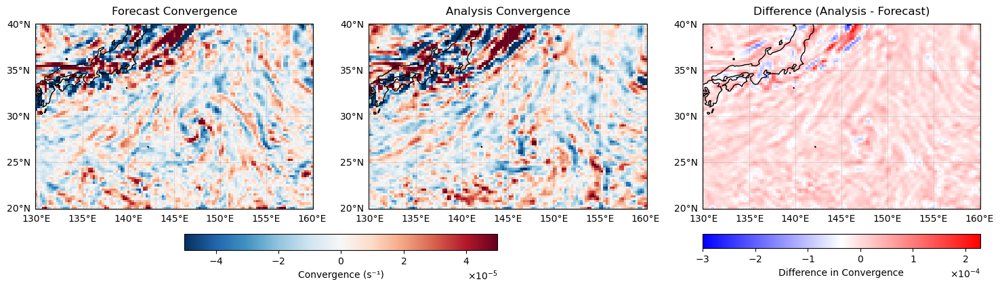

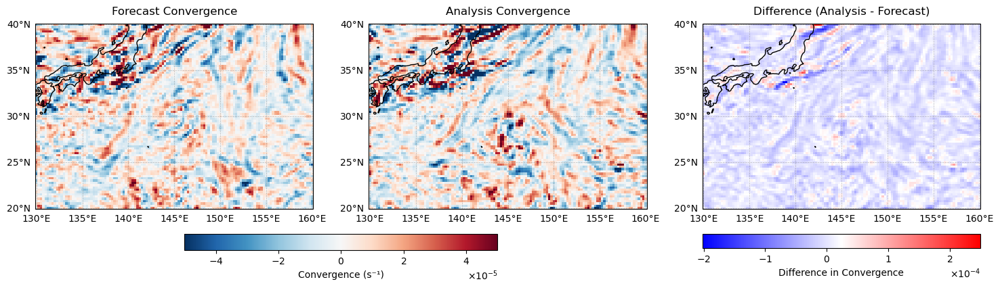

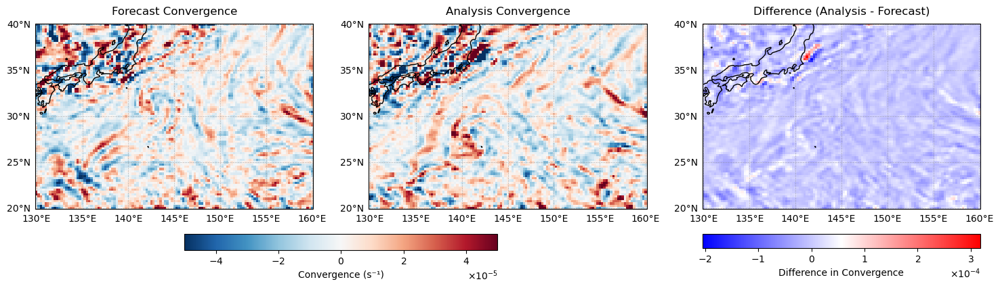

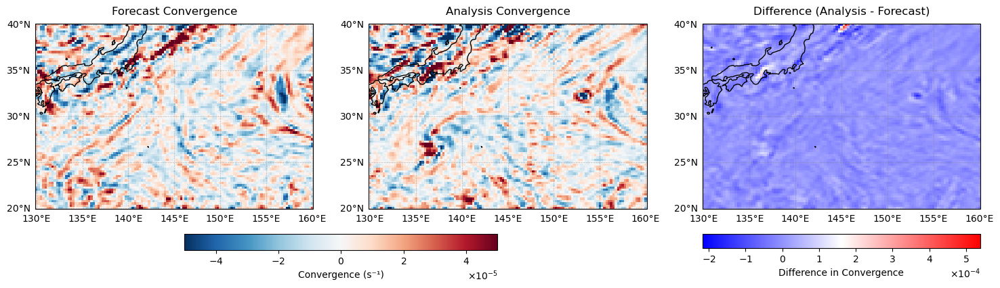

In [107]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.ticker as mticker
import metpy.calc as mpcalc
from metpy.units import units
from matplotlib.ticker import ScalarFormatter

level = 850

for i in range(0, 49, 12):  # 0, 6, 12, 18, 24
    # --- Forecast u,v ---
    fc_u = ds.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(130,160))["u"]
    fc_v = ds.sel(date=ds.date[0], step=np.timedelta64(24+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(130,160))["v"]

    # --- Analysis u,v ---
    an_u = ds.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(130,160))["u"]
    an_v = ds.sel(date=ds.date[1], step=np.timedelta64(0+i, "h"),
                level=level, latitude=slice(40,20), longitude=slice(130,160))["v"]

    # --- Grid spacing (dx, dy in meters) ---
    lat = fc_u.latitude.values * units.degrees
    lon = fc_u.longitude.values * units.degrees
    dx, dy = mpcalc.lat_lon_grid_deltas(lon, lat)

    # --- Vorticity ---
    fc_vort = mpcalc.vorticity(fc_u.values * units('m/s'),
                            fc_v.values * units('m/s'),
                            dx=dx, dy=dy)

    an_vort = mpcalc.vorticity(an_u.values * units('m/s'),
                            an_v.values * units('m/s'),
                            dx=dx, dy=dy)

    diff_vort = (an_vort - fc_vort).to('1/s')

    # --- Divergence (Convergence = -Divergence) ---
    fc_div = mpcalc.divergence(fc_u.values * units('m/s'),
                            fc_v.values * units('m/s'),
                            dx=dx, dy=dy)

    an_div = mpcalc.divergence(an_u.values * units('m/s'),
                            an_v.values * units('m/s'),
                            dx=dx, dy=dy)

    diff_div = (an_div - fc_div).to('1/s')

    fc_conv = -fc_div   # Convergence = - divergence
    an_conv = -an_div
    diff_conv = -diff_div

    # --- Plot Convergence ---
    fig, axes = plt.subplots(1, 3, figsize=(18,6), subplot_kw={'projection': ccrs.PlateCarree()})

    vmin, vmax = -5e-05, 5e-05

    im0 = axes[0].pcolormesh(fc_u.longitude, fc_u.latitude, fc_conv.magnitude,
                            cmap="RdBu_r", vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axes[0].set_title("Forecast Convergence")
    axes[0].coastlines()

    im1 = axes[1].pcolormesh(an_u.longitude, an_u.latitude, an_conv.magnitude,
                            cmap="RdBu_r", vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axes[1].set_title("Analysis Convergence")
    axes[1].coastlines()

    im2 = axes[2].pcolormesh(an_u.longitude, an_u.latitude, diff_conv.magnitude,
                            cmap="bwr", transform=ccrs.PlateCarree())
    axes[2].set_title("Difference (Analysis - Forecast)")
    axes[2].coastlines()

    # 좌표 격자
    for ax in axes:
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle="--")
        gl.xlocator = mticker.FixedLocator(range(130, 161, 5))
        gl.ylocator = mticker.FixedLocator(range(20, 41, 5))
        gl.top_labels = False
        gl.right_labels = False

    # Colorbars
    cbar1 = fig.colorbar(im0, ax=axes[:2], orientation="horizontal", fraction=0.05, pad=0.08, label="Convergence (s⁻¹)")
    cbar2 = fig.colorbar(im2, ax=[axes[2]], orientation="horizontal", fraction=0.05, pad=0.08, label="Difference in Convergence")

    # 지수 표기로 변경
    for cb in [cbar1, cbar2]:
        cb.formatter = ScalarFormatter(useMathText=True)
        cb.formatter.set_powerlimits((-2, 2))
        cb.update_ticks()

    plt.show()
